In [1]:
import numpy as np
import pandas as pd

In [2]:
df = pd.read_csv('C:/Users/aksha/Cricket_data_analytics/data/season_stats.csv')

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
df.head()

,season,batting_team,batter,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus
0,2008,Chennai Super Kings,A Mukund,1,1,0,1,0,0,0,0,0,0.00,1,0.00,0,0,0
1,2008,Chennai Super Kings,CK Kapugedera,3,22,16,10,12,2,0,0,0,66.67,3,5.33,0,0,0
2,2008,Chennai Super Kings,JA Morkel,10,162,241,63,62,10,1,18,14,143.45,8,30.12,3,1,0
3,2008,Chennai Super Kings,JDP Oram,2,12,18,4,6,1,0,1,1,138.46,1,18.00,0,0,0
4,2008,Chennai Super Kings,Joginder Sharma,2,11,16,3,6,0,0,1,1,145.45,2,8.00,0,0,0


In [5]:
df = df.query('matches >= 7 and total_runs > 50')

In [6]:
df['batting_average'] = np.where(df['dismissals'] > 0, round((df['total_runs'] / df['dismissals']), 2), 0)
df['boundaries(4s/6s)'] = df['fours'].astype(str) + '/' + df['sixes'].astype(str)
df['boundaries_runs'] = df['fours']*4 + df['sixes']*6
df['runs/ball'] = round((df['total_runs'] / df['total_balls']), 2)
df['Consistency_index(%)'] = round(((df['thirty_plus']*1 + df['fifty_plus']*2 + df['hundred_plus']*3) / df['matches'])*100, 2)

In [7]:
df['runs_rbw'] = df['total_runs'] - df['boundaries_runs']
df['runs_rbw%'] = round((df['runs_rbw'] / df['total_runs'])*100, 2)
df['boundary_runs%'] = round((df['boundaries_runs'] / df['total_runs'])*100, 2)
df['dot_balls%'] = round((df['dot_balls']/df['total_balls'])*100, 2)

In [8]:
df.query('batter == "V Kohli" and season == 2016')

,season,batting_team,batter,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus,boundaries(4s/6s),boundaries_runs,runs/ball,Consistency_index(%),runs_rbw,runs_rbw%,boundary_runs%,dot_balls%
1371,2016,Royal Challengers Bangalore,V Kohli,16,637,973,184,291,56,2,84,38,148.55,12,81.08,12,7,4,84/38,564,1.53,237.5,409,42.03,57.97,28.89


In [9]:
df.query('batter == "GJ Maxwell" and season == 2021')

,season,batting_team,batter,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus,boundaries(4s/6s),boundaries_runs,runs/ball,Consistency_index(%),runs_rbw,runs_rbw%,boundary_runs%,dot_balls%
2059,2021,Royal Challengers Bangalore,GJ Maxwell,14,354,513,136,141,27,0,48,21,137.53,11,46.64,8,6,0,48/21,318,1.45,142.86,195,38.01,61.99,38.42


In [10]:
top_10_batters_runs = df.groupby(['season', 'batter'])['total_runs'].sum().reset_index()

In [11]:
top_10_batters_runs = top_10_batters_runs.sort_values(by='total_runs', ascending=False).head(10)

In [12]:
top_10_batters_runs

,season,batter,total_runs
525,2016,V Kohli,973
952,2023,Shubman Gill,890
829,2022,JC Buttler,863
490,2016,DA Warner,848
1033,2024,V Kohli,741
612,2018,KS Williamson,735
230,2012,CH Gayle,733
331,2013,MEK Hussey,733
904,2023,F du Plessis,730
303,2013,CH Gayle,708


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

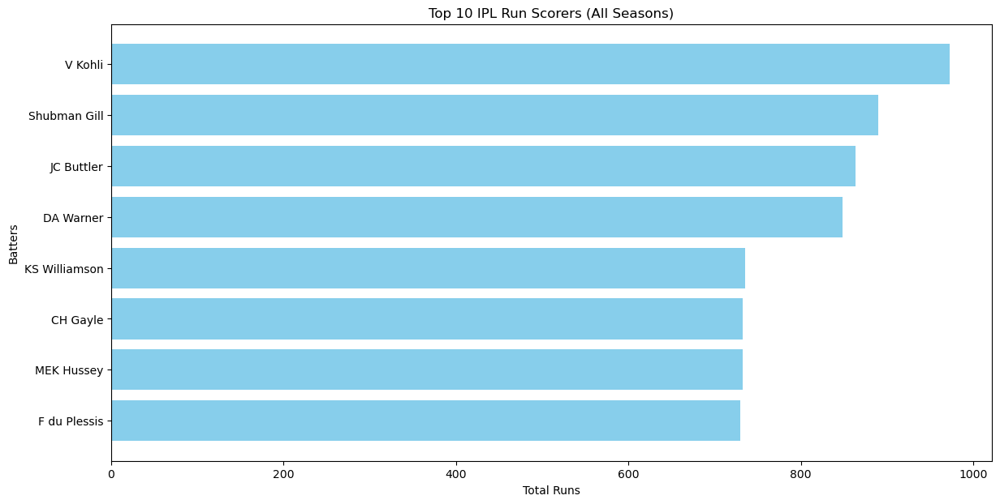

In [14]:
plt.figure(figsize=(14,7))
plt.barh(top_10_batters_runs['batter'], top_10_batters_runs['total_runs'], color='skyblue')
plt.xlabel('Total Runs')
plt.ylabel('Batters')
plt.title("Top 10 IPL Run Scorers (All Seasons)")
plt.gca().invert_yaxis()
plt.show()

In [15]:
df_grouped = (df.groupby(['season', 'batter'])['total_runs'].sum().reset_index())

In [16]:
df_grouped = df_grouped.sort_values('total_runs', ascending=False).head(20)

In [17]:
df_grouped.head()

,season,batter,total_runs
525,2016,V Kohli,973
952,2023,Shubman Gill,890
829,2022,JC Buttler,863
490,2016,DA Warner,848
1033,2024,V Kohli,741


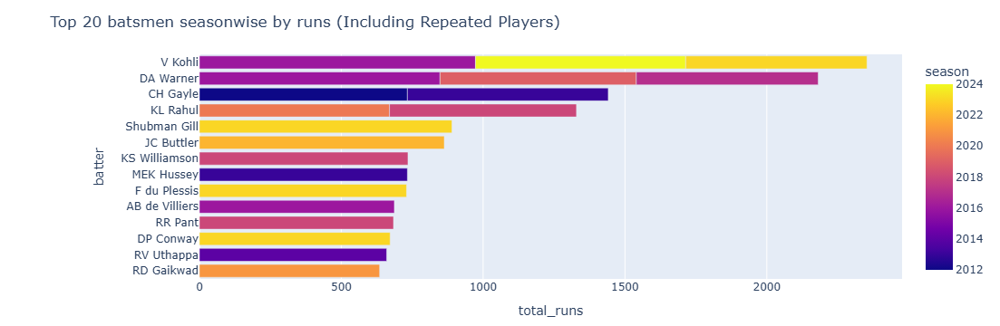

In [18]:
fig = px.bar(
    df_grouped,
    x = 'total_runs',
    y = 'batter',
    color = 'season',
    orientation = 'h',
    hover_data = ['season', 'total_runs'],
    title = "Top 20 batsmen seasonwise by runs (Including Repeated Players)"
)

fig.update_layout(
    yaxis = {'categoryorder':'total ascending'},
    height = 800,
    margin = dict(l=220, r=40, t=60, b=40)
)

fig.show()

In [19]:
df.head(2)

,season,batting_team,batter,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus,boundaries(4s/6s),boundaries_runs,runs/ball,Consistency_index(%),runs_rbw,runs_rbw%,boundary_runs%,dot_balls%
2,2008,Chennai Super Kings,JA Morkel,10,162,241,63,62,10,1,18,14,143.45,8,30.12,3,1,0,18/14,156,1.49,50.00,85,35.27,64.73,38.89
10,2008,Chennai Super Kings,MS Dhoni,14,310,414,124,114,26,2,38,15,129.78,11,37.64,8,2,0,38/15,242,1.34,85.71,172,41.55,58.45,40.00


In [20]:
df['batting_quality'] = round(((df['batting_average']/30) + (df['strike_rate']/130))/2, 2)

In [21]:
df['frequency'] = round((df['total_balls']/df['matches']), 2)

In [22]:
df['PI_Score'] = round((df['batting_quality'] * df['frequency']), 2)
df['Batting_Index'] = round((df['strike_rate'] * df['batting_average'])/100, 2)

In [23]:
df.query('batter == "V Kohli" and season == 2016')

,season,batting_team,batter,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus,boundaries(4s/6s),boundaries_runs,runs/ball,Consistency_index(%),runs_rbw,runs_rbw%,boundary_runs%,dot_balls%,batting_quality,frequency,PI_Score,Batting_Index
1371,2016,Royal Challengers Bangalore,V Kohli,16,637,973,184,291,56,2,84,38,148.55,12,81.08,12,7,4,84/38,564,1.53,237.5,409,42.03,57.97,28.89,1.92,39.81,76.44,120.44


In [24]:
df_scaled = df.copy()

In [25]:
features = ['total_runs', 'strike_rate', 'batting_average', 'fours', 'sixes', 'boundaries_runs', 'runs_rbw', 'Consistency_index(%)', 'runs_rbw%', 'boundary_runs%', 'dot_balls%', 'PI_Score', 'Batting_Index']                    

In [26]:
from sklearn.preprocessing import MinMaxScaler

In [27]:
scaler = MinMaxScaler(feature_range=(0, 1))

In [28]:
df_scaled[features] = scaler.fit_transform(df[features])

In [29]:
vk_stats = df_scaled.query('batter == "V Kohli"')

In [30]:
vk_stats[features].corr()

,total_runs,strike_rate,batting_average,fours,sixes,boundaries_runs,runs_rbw,Consistency_index(%),runs_rbw%,boundary_runs%,dot_balls%,PI_Score,Batting_Index
total_runs,1.000000,0.751454,0.978052,0.929108,0.892917,0.971458,0.928489,0.918360,-0.280993,0.280993,-0.572257,0.970866,0.976271
strike_rate,0.751454,1.000000,0.712819,0.708462,0.778102,0.784962,0.611682,0.717231,-0.430876,0.430876,-0.818356,0.714079,0.783263
batting_average,0.978052,0.712819,1.000000,0.886043,0.856549,0.928712,0.941650,0.934188,-0.189448,0.189448,-0.597891,0.991783,0.989519
fours,0.929108,0.708462,0.886043,1.000000,0.764043,0.956015,0.779028,0.872386,-0.499879,0.499879,-0.441850,0.892816,0.892920
sixes,0.892917,0.778102,0.856549,0.764043,1.000000,0.919675,0.747275,0.781834,-0.424598,0.424598,-0.476465,0.859754,0.891879
boundaries_runs,0.971458,0.784962,0.928712,0.956015,0.919675,1.000000,0.813897,0.886431,-0.497291,0.497291,-0.485552,0.934291,0.948960
runs_rbw,0.928489,0.611682,0.941650,0.779028,0.747275,0.813897,1.000000,0.861637,0.090270,-0.090270,-0.641501,0.915315,0.905591
Consistency_index(%),0.918360,0.717231,0.934188,0.872386,0.781834,0.886431,0.861637,1.000000,-0.235944,0.235944,-0.596739,0.954805,0.931971
runs_rbw%,-0.280993,-0.430876,-0.189448,-0.499879,-0.424598,-0.497291,0.090270,-0.235944,1.000000,-1.000000,-0.115312,-0.237787,-0.275487
boundary_runs%,0.280993,0.430876,0.189448,0.499879,0.424598,0.497291,-0.090270,0.235944,-1.000000,1.000000,0.115312,0.237787,0.275487


<Axes: >

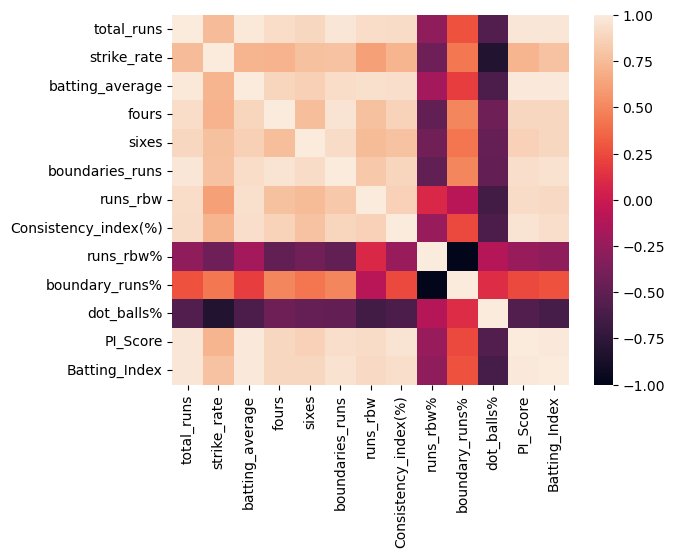

In [31]:
import seaborn as sns
sns.heatmap(vk_stats[features].corr())

<Axes: >

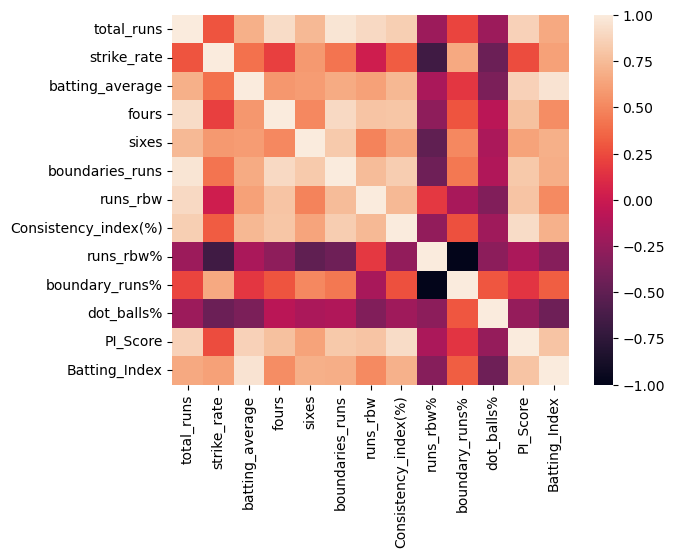

In [32]:
sns.heatmap(df_scaled[features].corr())

<Axes: >

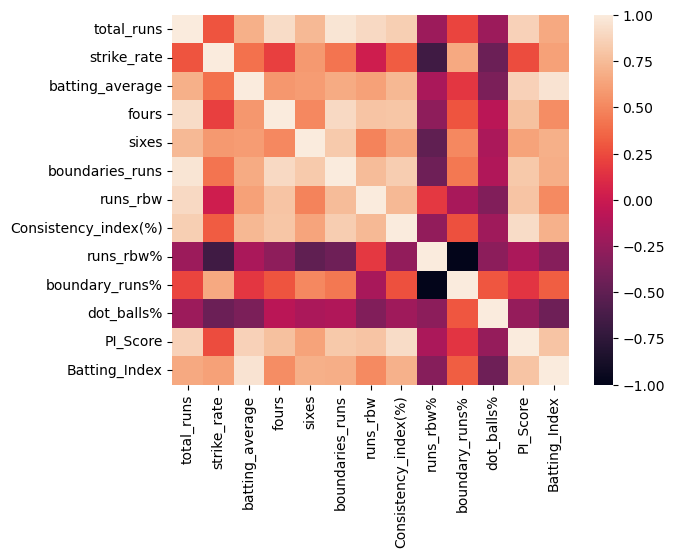

In [33]:
sns.heatmap(df[features].corr())

In [34]:
from sklearn.linear_model import Ridge, Lasso, LinearRegression, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error

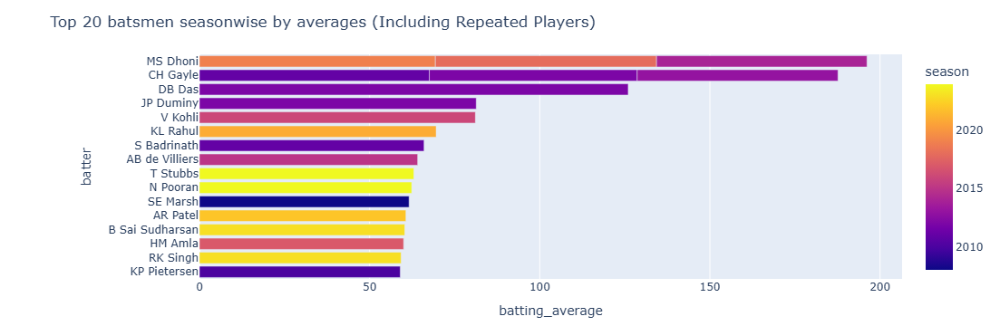

In [35]:
fig = px.bar(
    df.sort_values(by='batting_average', ascending=False).head(20),
    x = 'batting_average',
    y = 'batter',
    color = 'season',
    orientation = 'h',
    hover_data = ['season', 'batting_average'],
    title = "Top 20 batsmen seasonwise by averages (Including Repeated Players)"
)

fig.update_layout(
    yaxis = {'categoryorder':'total ascending'},
    height = 800,
    margin = dict(l=220, r=40, t=60, b=40)
)

fig.show()

In [36]:
top_10_avg = df.sort_values(by = 'batting_average', ascending=False).head(10)

In [37]:
top_10_avg.head()

,season,batting_team,batter,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus,boundaries(4s/6s),boundaries_runs,runs/ball,Consistency_index(%),runs_rbw,runs_rbw%,boundary_runs%,dot_balls%,batting_quality,frequency,PI_Score,Batting_Index
727,2012,Kolkata Knight Riders,DB Das,10,92,126,35,38,8,0,9,6,131.25,1,126.00,1,0,0,9/6,72,1.37,10.00,54,42.86,57.14,38.04,2.60,9.20,23.92,165.38
677,2012,Deccan Chargers,JP Duminy,9,190,244,62,92,17,0,13,11,125.13,3,81.33,2,2,0,13/11,118,1.28,66.67,126,51.64,48.36,32.63,1.84,21.11,38.84,101.77
1371,2016,Royal Challengers Bangalore,V Kohli,16,637,973,184,291,56,2,84,38,148.55,12,81.08,12,7,4,84/38,564,1.53,237.50,409,42.03,57.97,28.89,1.92,39.81,76.44,120.44
2020,2021,Punjab Kings,KL Rahul,13,450,626,158,204,25,0,48,30,134.62,9,69.56,8,6,0,48/30,372,1.39,153.85,254,40.58,59.42,35.11,1.68,34.62,58.16,93.64
1679,2019,Chennai Super Kings,MS Dhoni,12,305,416,117,120,35,0,22,23,131.23,6,69.33,7,3,0,22/23,226,1.36,108.33,190,45.67,54.33,38.36,1.66,25.42,42.20,90.98


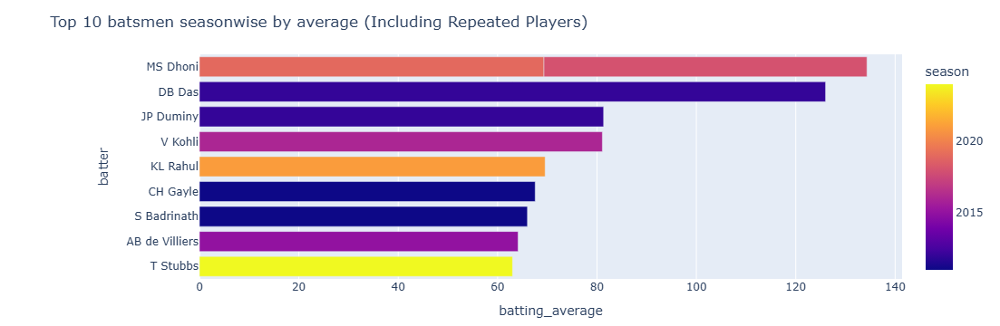

In [38]:
fig = px.bar(
    top_10_avg,
    x = 'batting_average',
    y = 'batter',
    color = 'season',
    orientation = 'h',
    hover_data = ['season', 'batting_average'],
    title = "Top 10 batsmen seasonwise by average (Including Repeated Players)"
)

fig.update_layout(
    yaxis = {'categoryorder':'total ascending'},
    height = 800,
    margin = dict(l=220, r=40, t=60, b=40)
)

fig.show()

In [39]:
top_10_sr = df.sort_values(by='strike_rate', ascending=False).head(30)

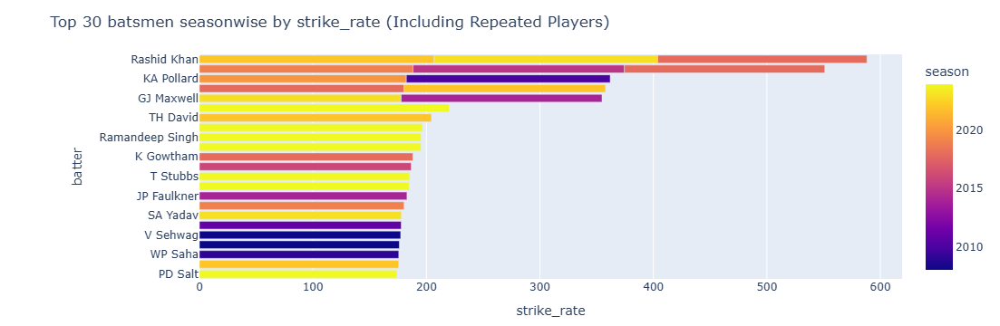

In [40]:
fig = px.bar(
    top_10_sr,
    x = 'strike_rate',
    y = 'batter',
    color = 'season',
    orientation = 'h',
    hover_data = ['season', 'strike_rate'],
    title = "Top 30 batsmen seasonwise by strike_rate (Including Repeated Players)"
)

fig.update_layout(
    yaxis = {'categoryorder':'total ascending'},
    height = 800,
    margin = dict(l=220, r=40, t=60, b=40)
)

fig.show()

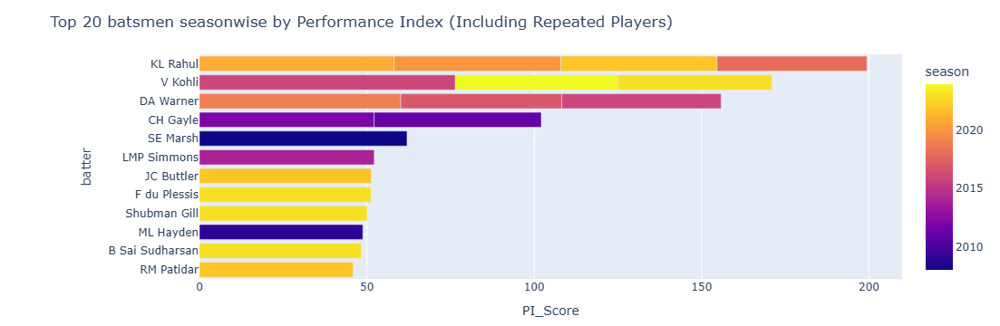

In [41]:
fig = px.bar(
    df.sort_values(by='PI_Score', ascending=False).head(20),
    x = 'PI_Score',
    y = 'batter',
    color = 'season',
    orientation = 'h',
    hover_data = ['season', 'PI_Score'],
    title = "Top 20 batsmen seasonwise by Performance Index (Including Repeated Players)"
)

fig.update_layout(
    yaxis = {'categoryorder':'total ascending'},
    height = 800,
    margin = dict(l=220, r=40, t=60, b=40)
)

fig.show()

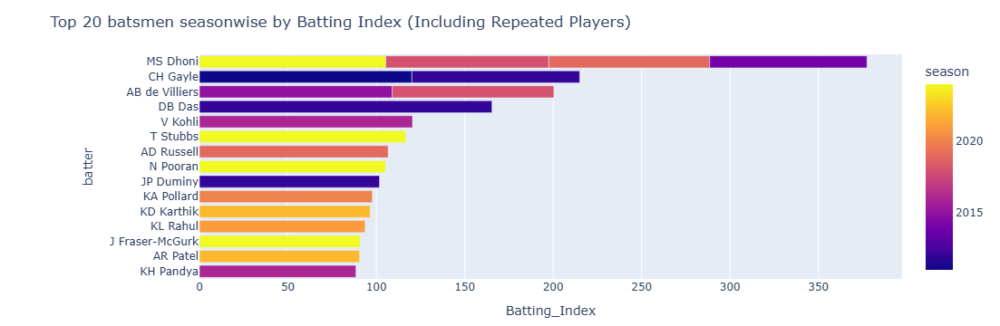

In [42]:
fig = px.bar(
    df.sort_values(by='Batting_Index', ascending=False).head(20),
    x = 'Batting_Index',
    y = 'batter',
    color = 'season',
    orientation = 'h',
    hover_data = ['season', 'Batting_Index'],
    title = "Top 20 batsmen seasonwise by Batting Index (Including Repeated Players)"
)

fig.update_layout(
    yaxis = {'categoryorder':'total ascending'},
    height = 800,
    margin = dict(l=220, r=40, t=60, b=40)
)

fig.show()

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1039 entries, 2 to 2614
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   season                1039 non-null   int64  
 1   batting_team          1039 non-null   object 
 2   batter                1039 non-null   object 
 3   matches               1039 non-null   int64  
 4   total_balls           1039 non-null   int64  
 5   total_runs            1039 non-null   int64  
 6   dot_balls             1039 non-null   int64  
 7   ones                  1039 non-null   int64  
 8   twos                  1039 non-null   int64  
 9   threes                1039 non-null   int64  
 10  fours                 1039 non-null   int64  
 11  sixes                 1039 non-null   int64  
 12  strike_rate           1039 non-null   float64
 13  dismissals            1039 non-null   int64  
 14  batting_average       1039 non-null   float64
 15  thirty_plus           1039

In [44]:
df_norm = df.copy()

In [45]:
df_norm.head()

,season,batting_team,batter,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus,boundaries(4s/6s),boundaries_runs,runs/ball,Consistency_index(%),runs_rbw,runs_rbw%,boundary_runs%,dot_balls%,batting_quality,frequency,PI_Score,Batting_Index
2,2008,Chennai Super Kings,JA Morkel,10,162,241,63,62,10,1,18,14,143.45,8,30.12,3,1,0,18/14,156,1.49,50.00,85,35.27,64.73,38.89,1.05,16.20,17.01,43.21
10,2008,Chennai Super Kings,MS Dhoni,14,310,414,124,114,26,2,38,15,129.78,11,37.64,8,2,0,38/15,242,1.34,85.71,172,41.55,58.45,40.00,1.13,22.14,25.02,48.85
12,2008,Chennai Super Kings,PA Patel,13,295,302,166,92,12,0,42,3,95.87,11,27.45,3,2,0,42/3,186,1.02,53.85,116,38.41,61.59,56.27,0.83,22.69,18.83,26.32
14,2008,Chennai Super Kings,S Badrinath,11,130,192,59,41,8,1,21,8,139.13,6,32.00,3,2,0,21/8,132,1.48,63.64,60,31.25,68.75,45.38,1.07,11.82,12.65,44.52
15,2008,Chennai Super Kings,S Vidyut,8,109,145,55,30,5,1,21,3,126.09,8,18.12,2,1,0,21/3,102,1.33,50.00,43,29.66,70.34,50.46,0.79,13.62,10.76,22.85


In [46]:
df_norm = df_norm.drop(columns=['season', 'batting_team', 'batter', 'boundaries(4s/6s)'])

In [47]:
numeric_cols = df_norm.select_dtypes(include='number').columns

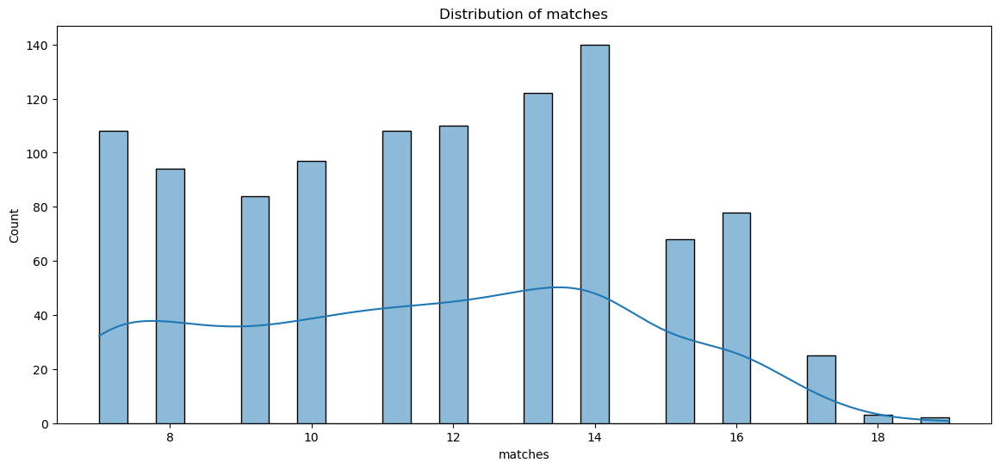

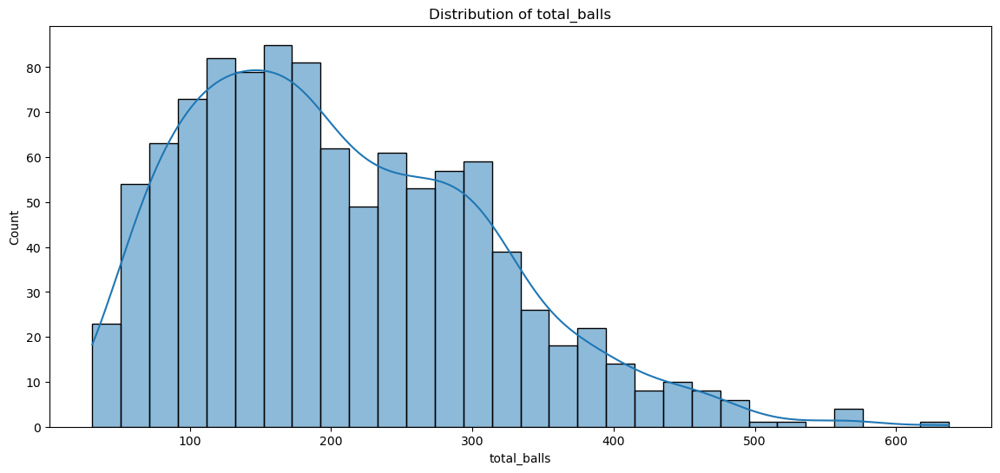

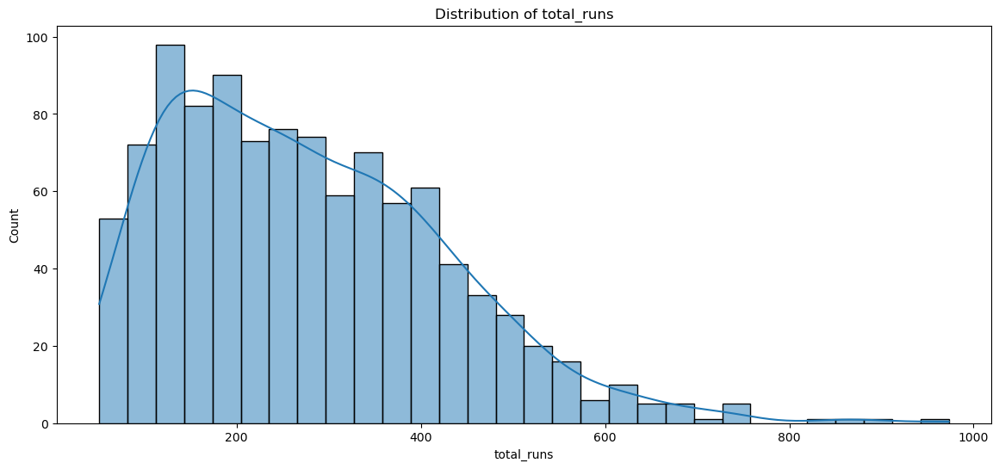

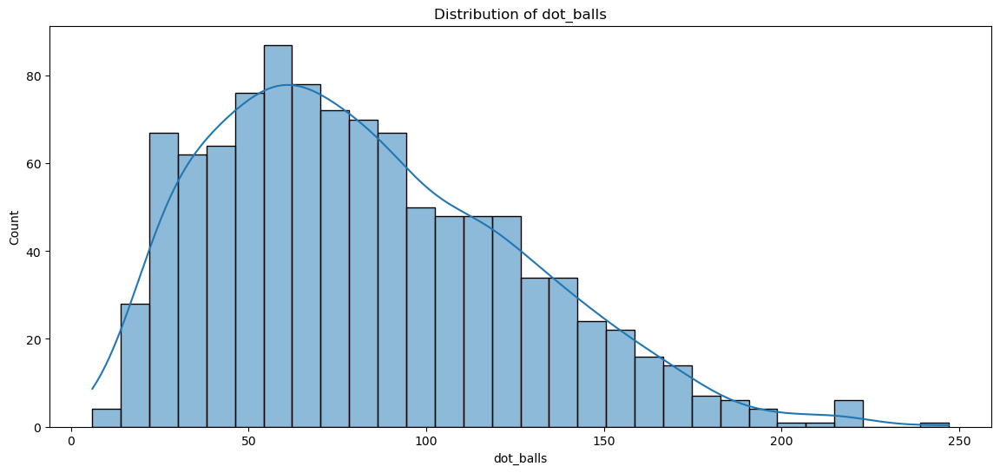

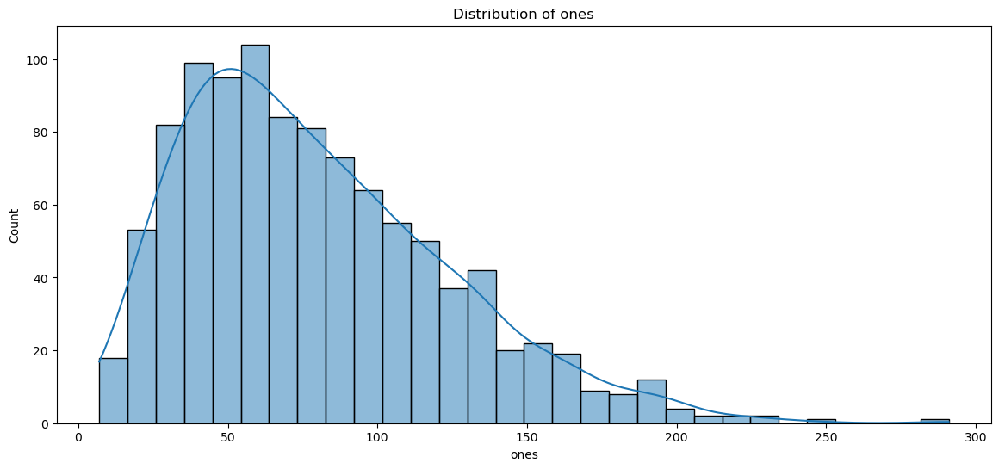

...

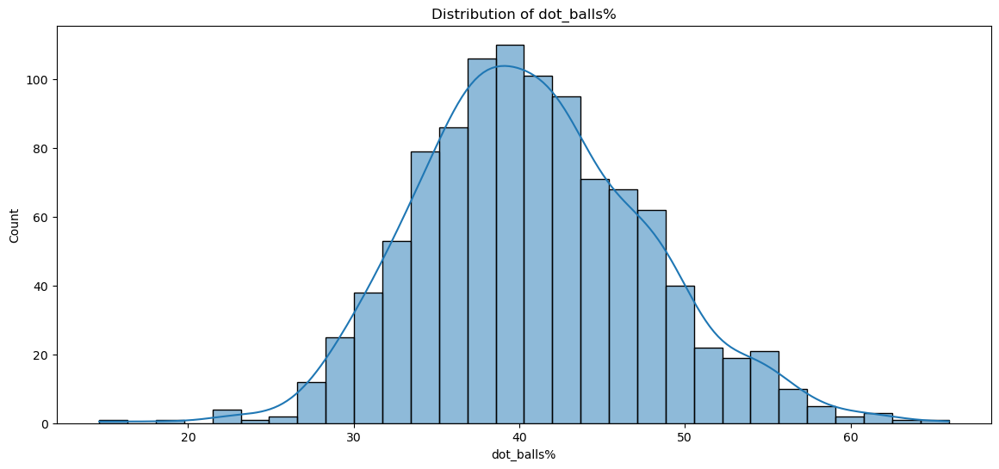

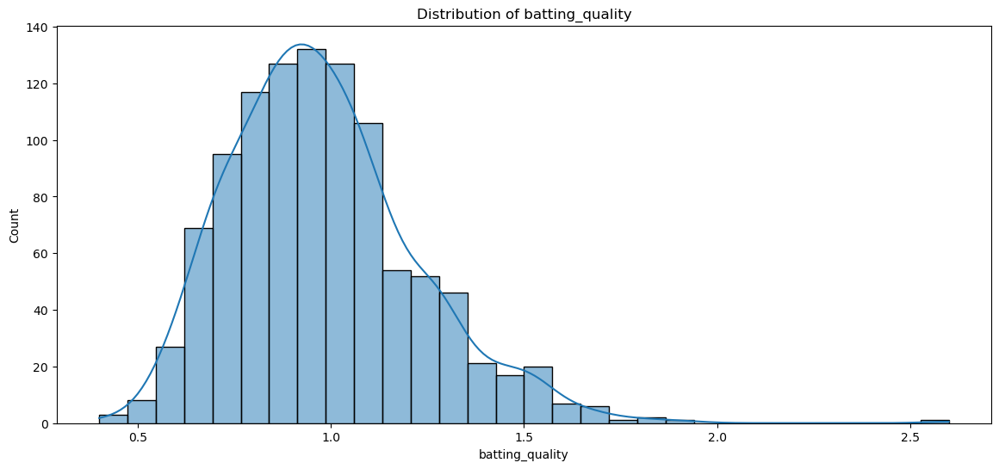

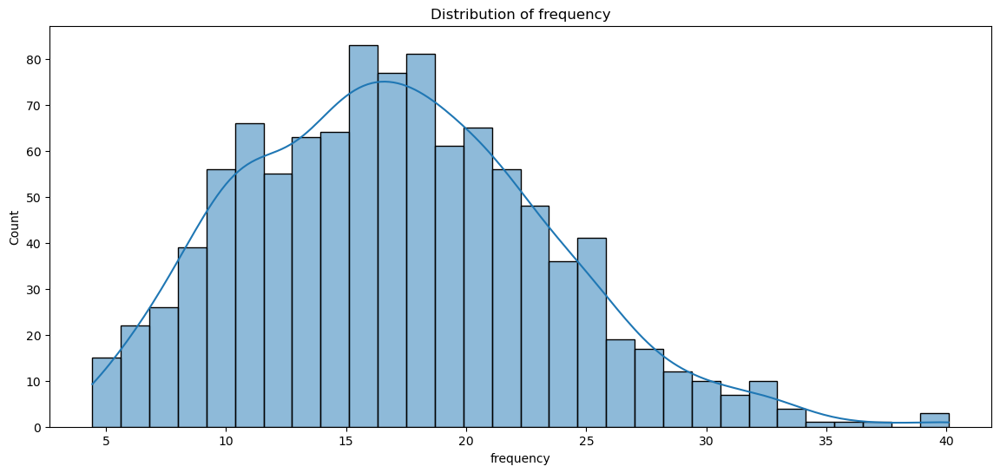

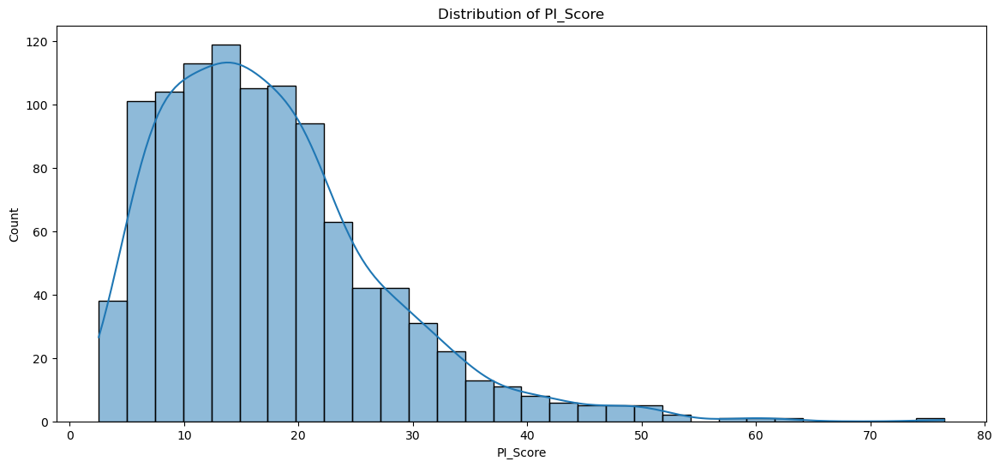

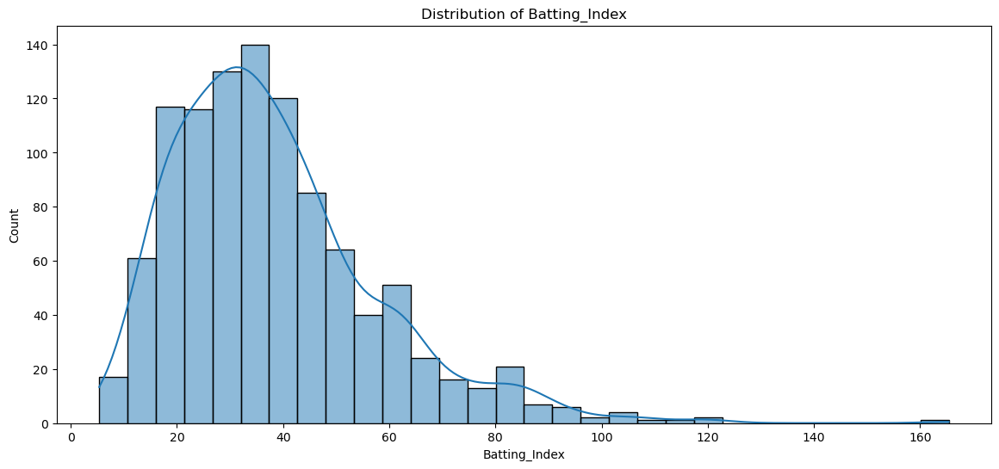

In [48]:
for col in numeric_cols:
    plt.figure(figsize=(14, 6))
    sns.histplot(df_norm[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.show()

In [49]:
from scipy.stats import skew
for col in numeric_cols:
    skew_val = skew(df[col].dropna())
    print(f"{col}:skewness = {skew_val:.2f}")

matches:skewness = -0.01
total_balls:skewness = 0.68
total_runs:skewness = 0.81
dot_balls:skewness = 0.65
ones:skewness = 0.87
twos:skewness = 1.23
threes:skewness = 1.67
fours:skewness = 0.90
sixes:skewness = 1.40
strike_rate:skewness = 0.60
dismissals:skewness = 0.14
batting_average:skewness = 1.27
thirty_plus:skewness = 0.56
fifty_plus:skewness = 1.11
hundred_plus:skewness = 5.21
boundaries_runs:skewness = 0.91
runs/ball:skewness = 0.71
Consistency_index(%):skewness = 0.74
runs_rbw:skewness = 0.91
runs_rbw%:skewness = 0.15
boundary_runs%:skewness = -0.15
dot_balls%:skewness = 0.27
batting_quality:skewness = 0.87
frequency:skewness = 0.42
PI_Score:skewness = 1.28
Batting_Index:skewness = 1.28


In [50]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')

In [51]:
from scipy.stats import skew
for col in numeric_cols:
    skew_val = skew(df[col].dropna())
    print(f"{col}:skewness = {skew_val:.2f}")

matches:skewness = -0.01
total_balls:skewness = 0.68
total_runs:skewness = 0.81
dot_balls:skewness = 0.65
ones:skewness = 0.87
twos:skewness = 1.23
threes:skewness = 1.67
fours:skewness = 0.90
sixes:skewness = 1.40
strike_rate:skewness = 0.60
dismissals:skewness = 0.14
batting_average:skewness = 1.27
thirty_plus:skewness = 0.56
fifty_plus:skewness = 1.11
hundred_plus:skewness = 5.21
boundaries_runs:skewness = 0.91
runs/ball:skewness = 0.71
Consistency_index(%):skewness = 0.74
runs_rbw:skewness = 0.91
runs_rbw%:skewness = 0.15
boundary_runs%:skewness = -0.15
dot_balls%:skewness = 0.27
batting_quality:skewness = 0.87
frequency:skewness = 0.42
PI_Score:skewness = 1.28
Batting_Index:skewness = 1.28


In [52]:
df_norm.head()

,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus,boundaries_runs,runs/ball,Consistency_index(%),runs_rbw,runs_rbw%,boundary_runs%,dot_balls%,batting_quality,frequency,PI_Score,Batting_Index
2,10,162,241,63,62,10,1,18,14,143.45,8,30.12,3,1,0,156,1.49,50.00,85,35.27,64.73,38.89,1.05,16.20,17.01,43.21
10,14,310,414,124,114,26,2,38,15,129.78,11,37.64,8,2,0,242,1.34,85.71,172,41.55,58.45,40.00,1.13,22.14,25.02,48.85
12,13,295,302,166,92,12,0,42,3,95.87,11,27.45,3,2,0,186,1.02,53.85,116,38.41,61.59,56.27,0.83,22.69,18.83,26.32
14,11,130,192,59,41,8,1,21,8,139.13,6,32.00,3,2,0,132,1.48,63.64,60,31.25,68.75,45.38,1.07,11.82,12.65,44.52
15,8,109,145,55,30,5,1,21,3,126.09,8,18.12,2,1,0,102,1.33,50.00,43,29.66,70.34,50.46,0.79,13.62,10.76,22.85


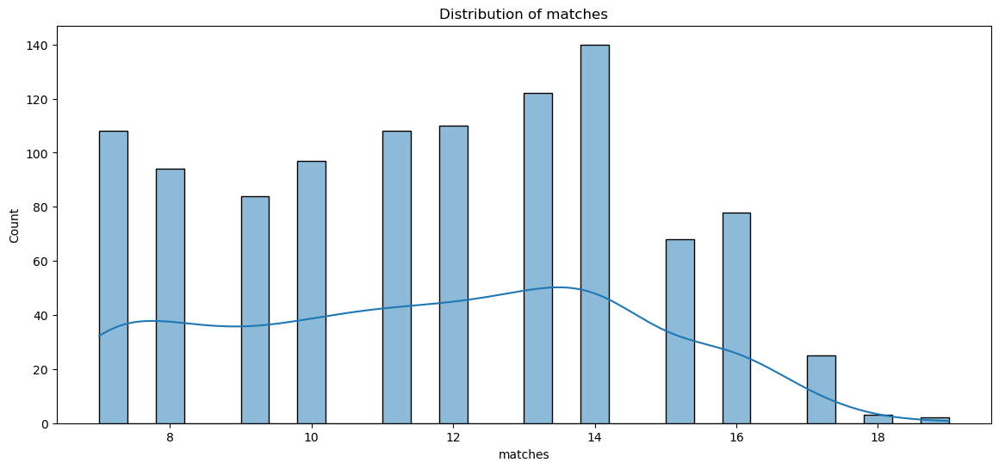

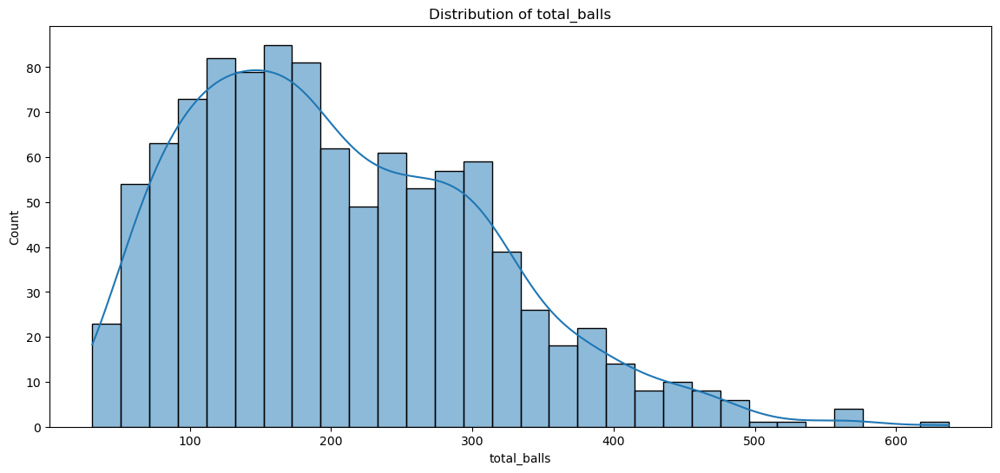

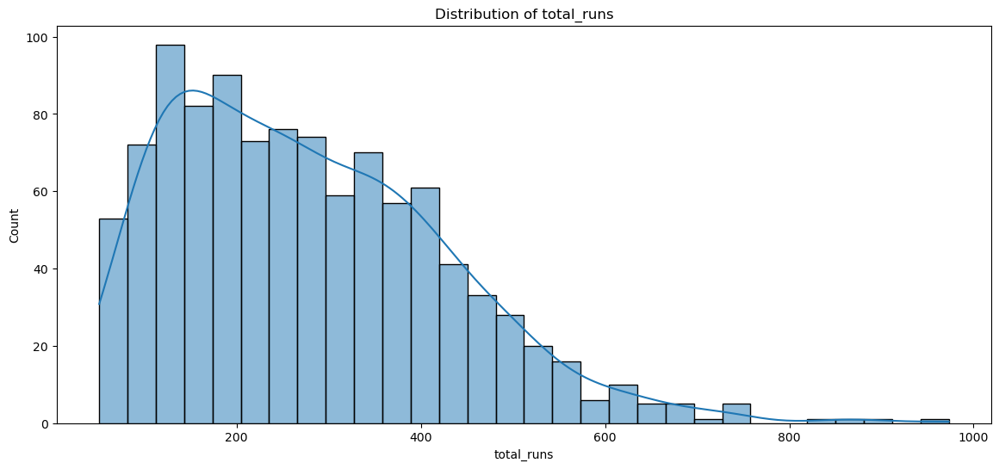

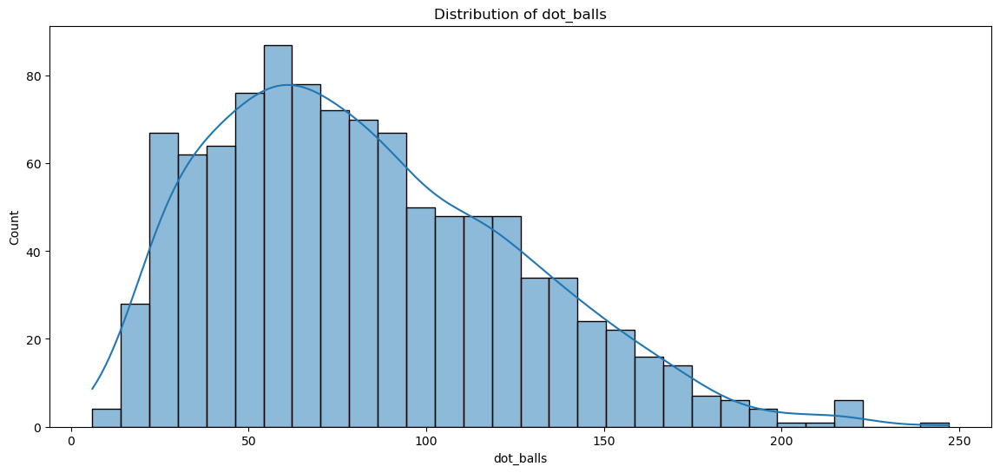

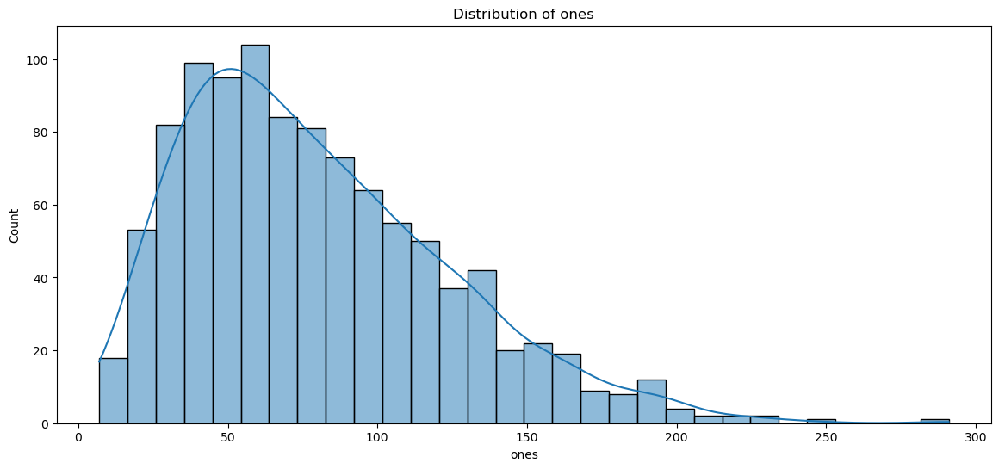

...

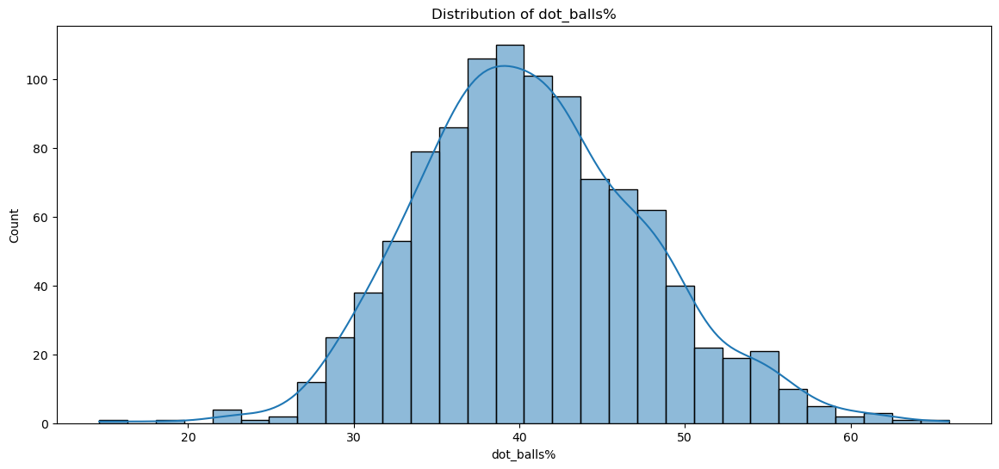

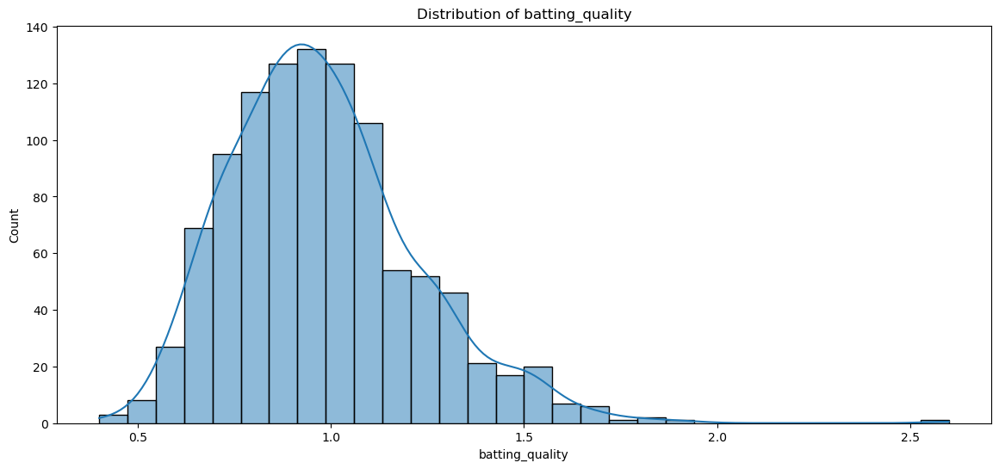

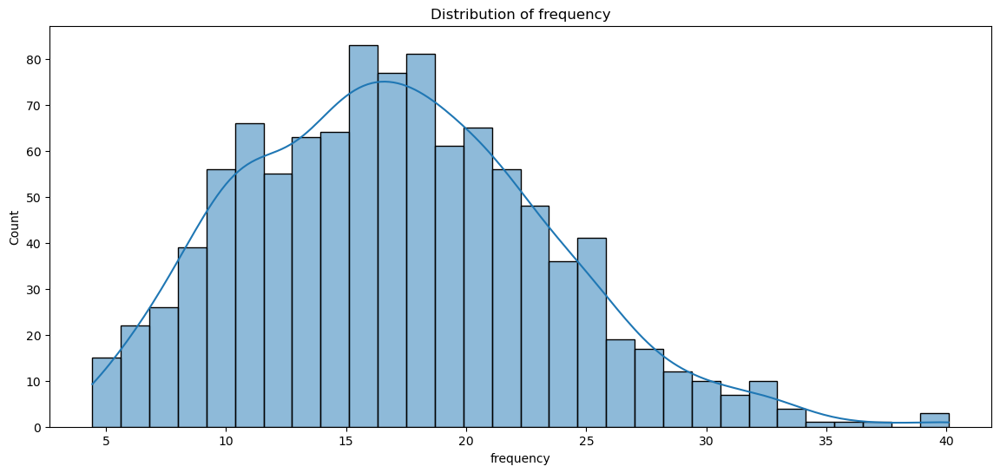

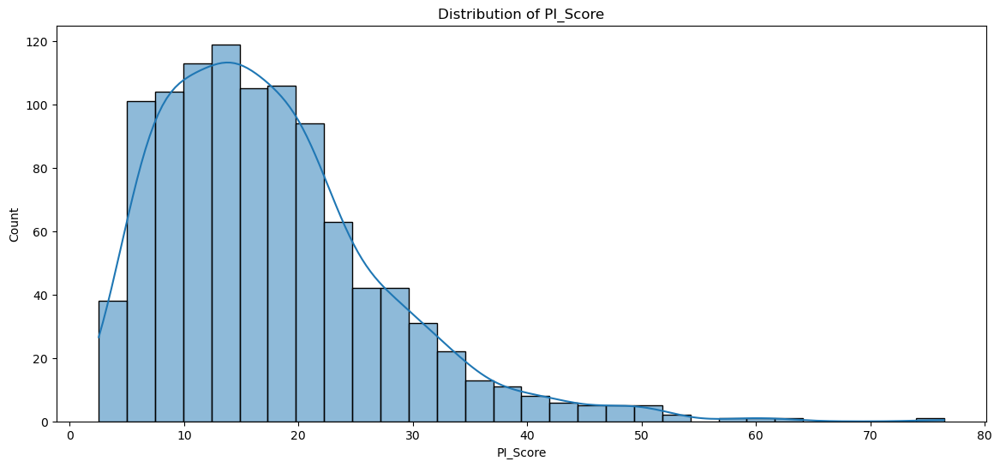

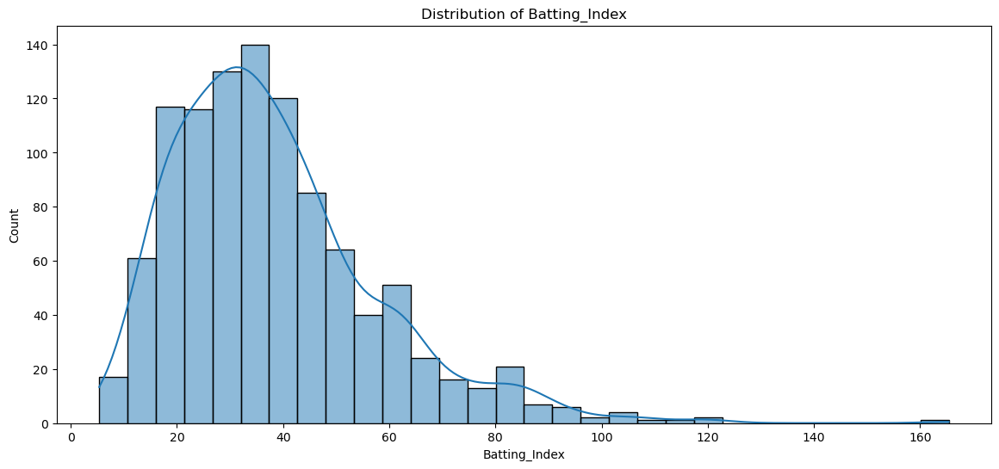

In [53]:
numeric_cols = df_norm.columns.tolist()
for col in numeric_cols:
    plt.figure(figsize=(14, 6))
    sns.histplot(df_norm[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.show()

In [54]:
scaler = MinMaxScaler(feature_range=(0, 1))
df_norm_scaled = pd.DataFrame(scaler.fit_transform(df_norm), columns=[f'{col}_norm' for col in numeric_cols])

In [55]:
df_norm_scaled.head()

,matches_norm,total_balls_norm,total_runs_norm,dot_balls_norm,ones_norm,twos_norm,threes_norm,fours_norm,sixes_norm,strike_rate_norm,dismissals_norm,batting_average_norm,thirty_plus_norm,fifty_plus_norm,hundred_plus_norm,boundaries_runs_norm,runs/ball_norm,Consistency_index(%)_norm,runs_rbw_norm,runs_rbw%_norm,boundary_runs%_norm,dot_balls%_norm,batting_quality_norm,frequency_norm,PI_Score_norm,Batting_Index_norm
0,0.250000,0.216172,0.206074,0.236515,0.193662,0.158730,0.2,0.195402,0.237288,0.482000,0.368421,0.202462,0.230769,0.111111,0.0,0.234694,0.463415,0.206894,0.185930,0.387312,0.612688,0.472904,0.295455,0.330154,0.195914,0.236485
1,0.583333,0.460396,0.393709,0.489627,0.376761,0.412698,0.4,0.425287,0.254237,0.389498,0.526316,0.265014,0.615385,0.222222,0.0,0.380952,0.371951,0.354657,0.404523,0.484722,0.515278,0.494542,0.331818,0.496774,0.304289,0.271733
2,0.500000,0.435644,0.272234,0.663900,0.299296,0.190476,0.0,0.471264,0.050847,0.160035,0.526316,0.180253,0.230769,0.222222,0.0,0.285714,0.176829,0.222825,0.263819,0.436017,0.563983,0.811696,0.195455,0.512202,0.220538,0.130929
3,0.333333,0.163366,0.152928,0.219917,0.119718,0.126984,0.2,0.229885,0.135593,0.452768,0.263158,0.218100,0.230769,0.222222,0.0,0.193878,0.457317,0.263334,0.123116,0.324957,0.675043,0.599415,0.304545,0.207293,0.136923,0.244672
4,0.083333,0.128713,0.101952,0.203320,0.080986,0.079365,0.2,0.229885,0.050847,0.364528,0.368421,0.102645,0.153846,0.111111,0.0,0.142857,0.365854,0.206894,0.080402,0.300295,0.699705,0.698441,0.177273,0.257784,0.111352,0.109243


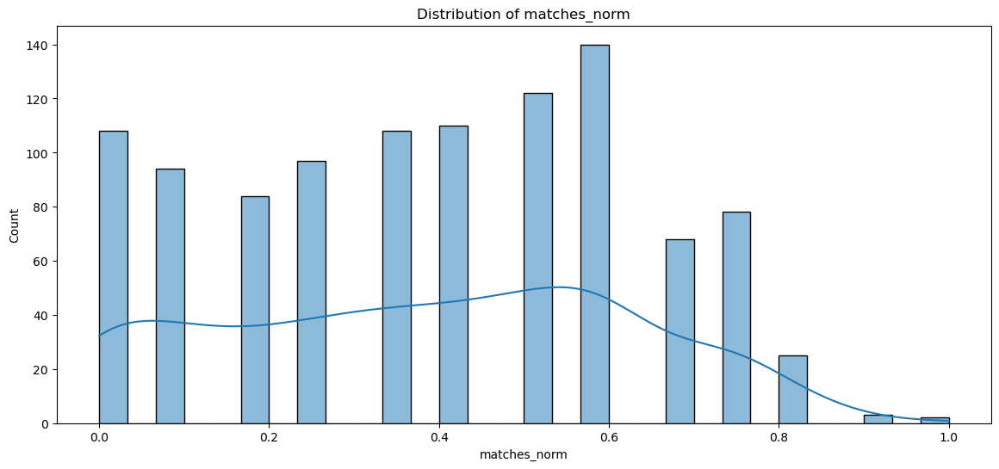

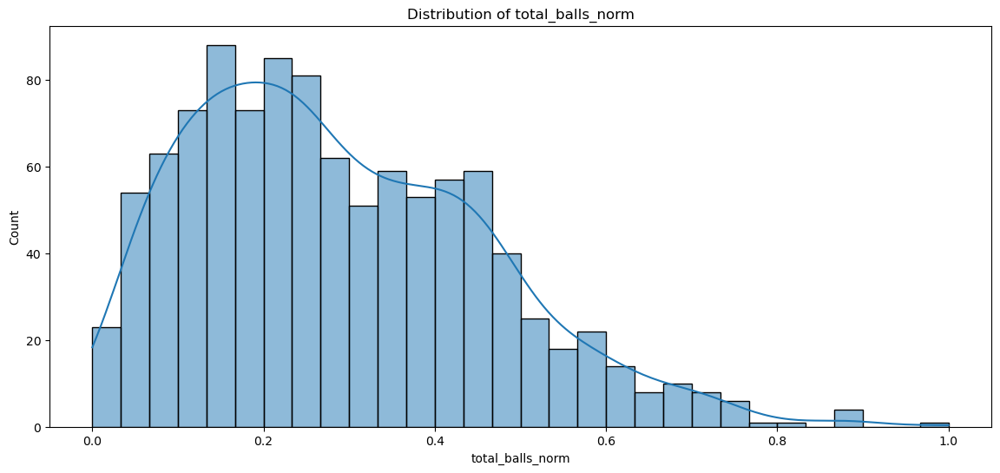

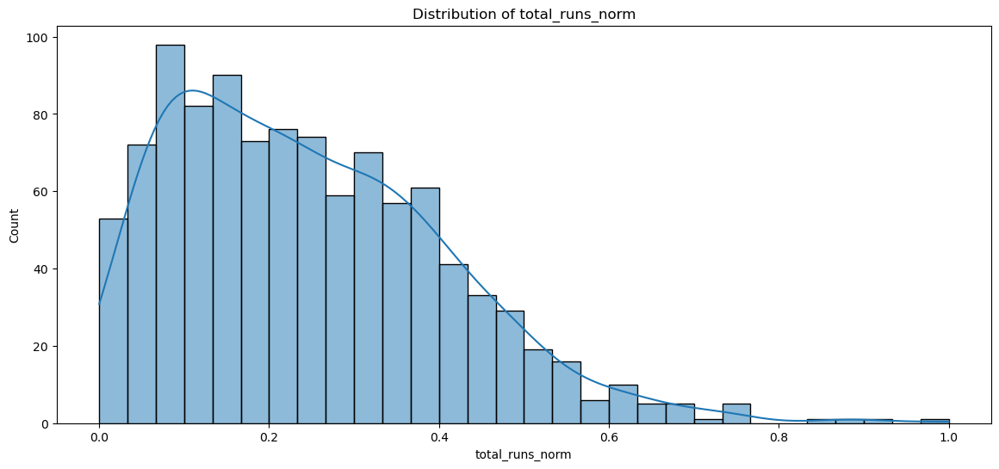

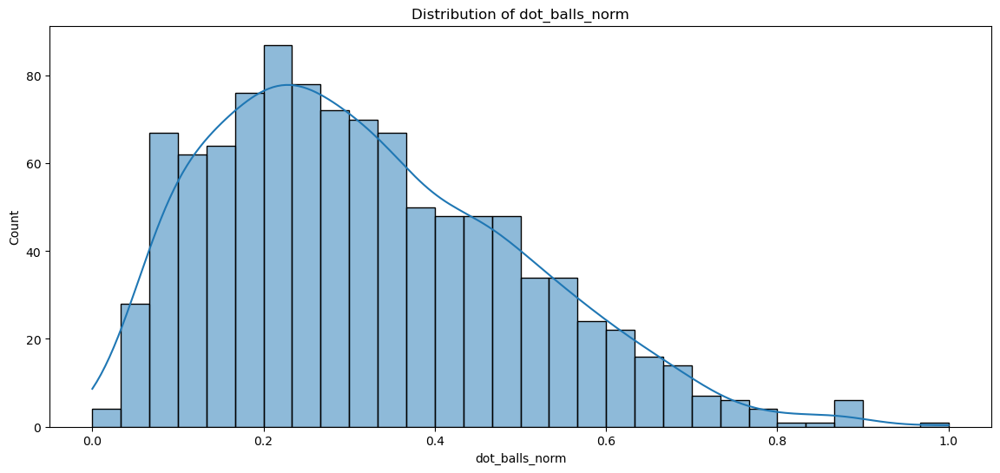

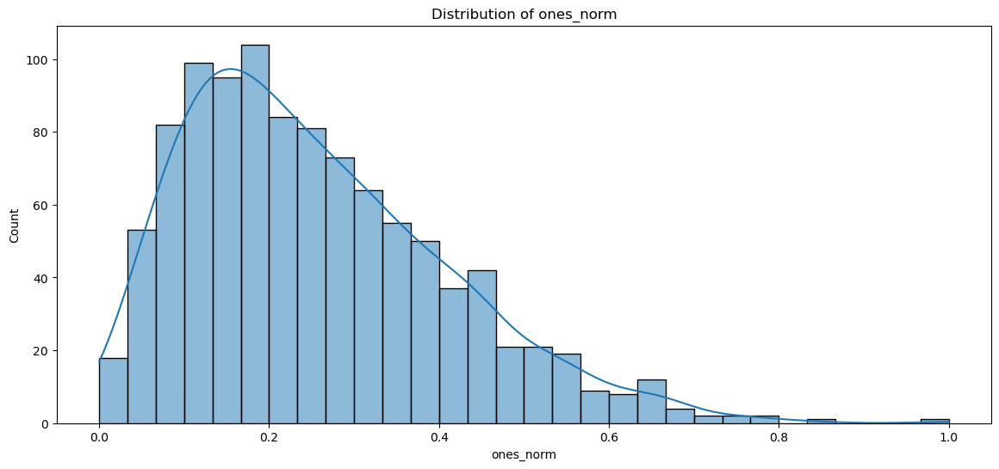

...

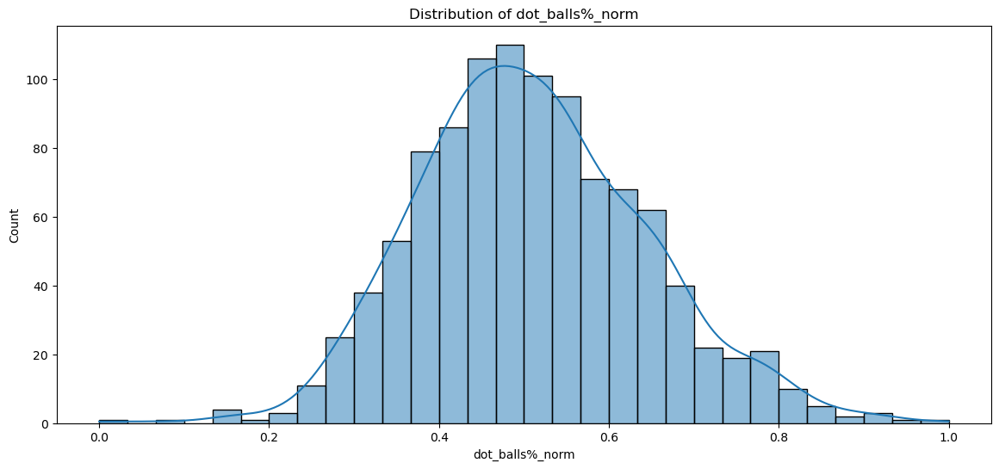

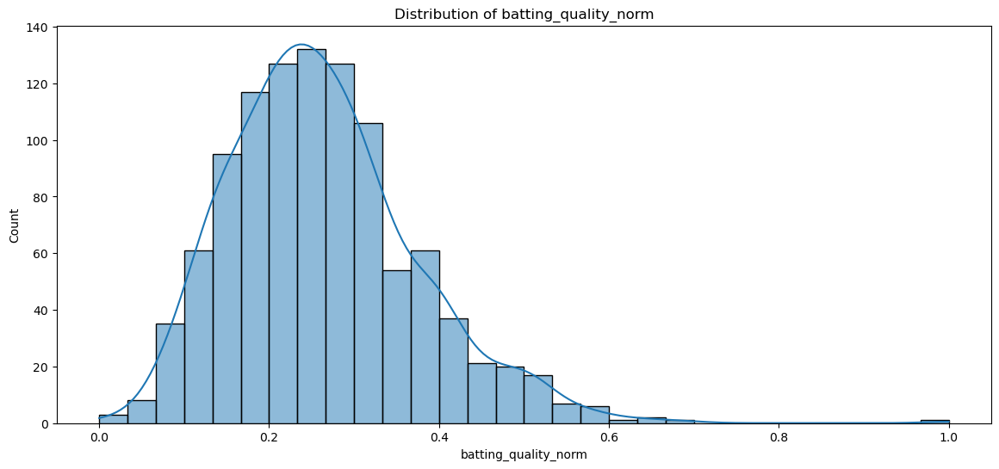

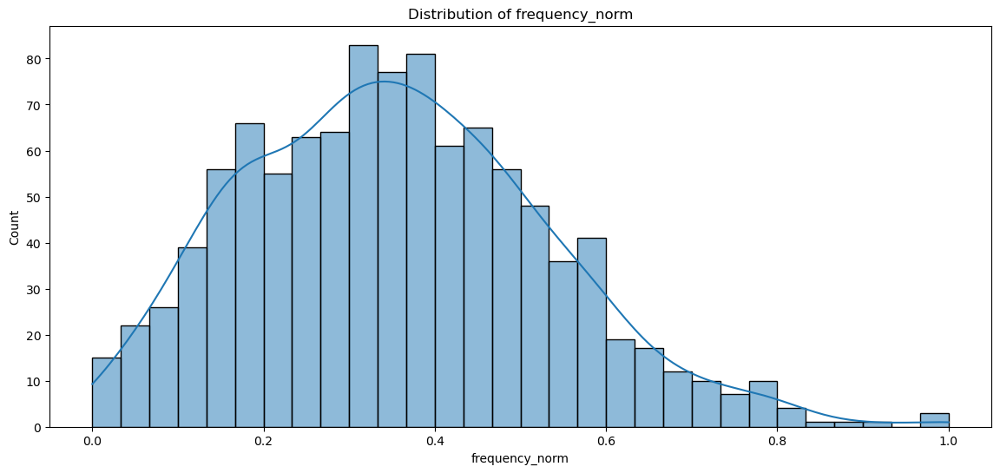

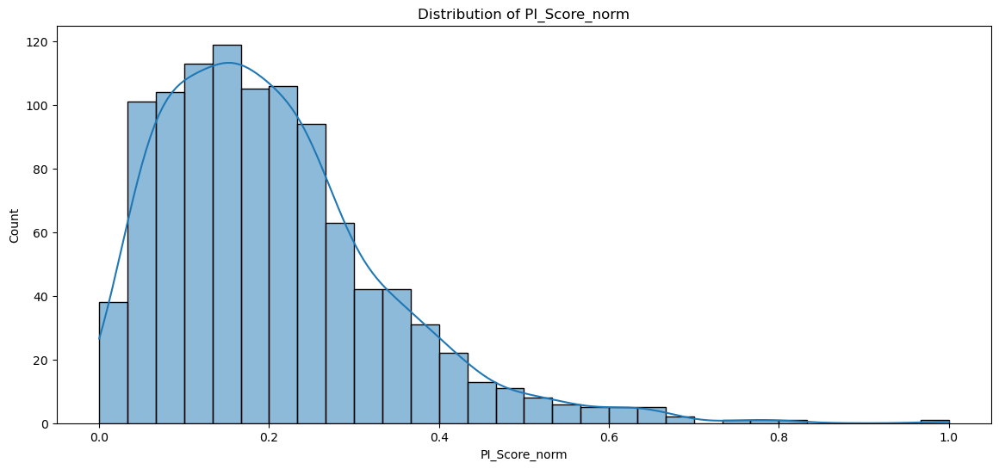

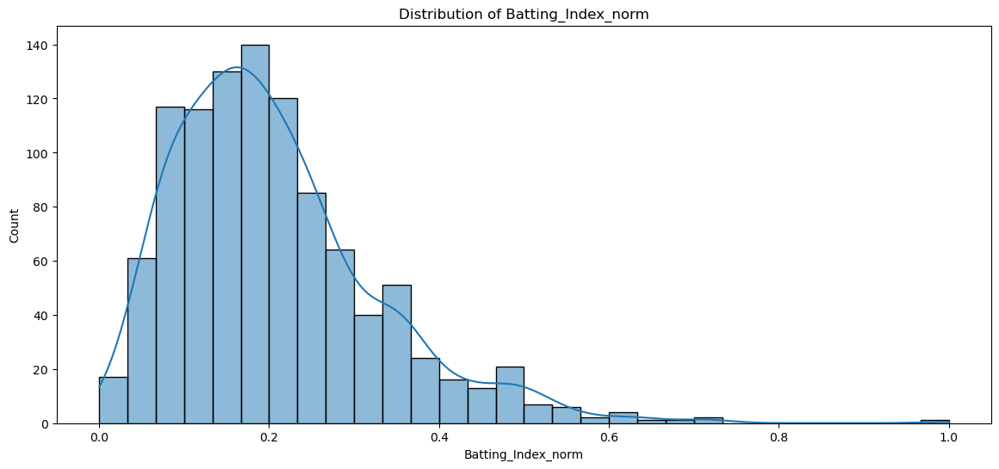

In [56]:

for col in df_norm_scaled.columns.tolist():
    plt.figure(figsize=(14, 6))
    sns.histplot(df_norm_scaled[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.show()

In [57]:
df_norm_scaled.columns

Index(['matches_norm', 'total_balls_norm', 'total_runs_norm', 'dot_balls_norm',
       'ones_norm', 'twos_norm', 'threes_norm', 'fours_norm', 'sixes_norm',
       'strike_rate_norm', 'dismissals_norm', 'batting_average_norm',
       'thirty_plus_norm', 'fifty_plus_norm', 'hundred_plus_norm',
       'boundaries_runs_norm', 'runs/ball_norm', 'Consistency_index(%)_norm',
       'runs_rbw_norm', 'runs_rbw%_norm', 'boundary_runs%_norm',
       'dot_balls%_norm', 'batting_quality_norm', 'frequency_norm',
       'PI_Score_norm', 'Batting_Index_norm'],
      dtype='object')

In [58]:
from scipy.stats import skew
for col in df_norm_scaled.columns.tolist():
    skew_val = skew(df_norm_scaled[col].dropna())
    print(f"{col}:skewness = {skew_val:.2f}")

matches_norm:skewness = -0.01
total_balls_norm:skewness = 0.68
total_runs_norm:skewness = 0.81
dot_balls_norm:skewness = 0.65
ones_norm:skewness = 0.87
twos_norm:skewness = 1.23
threes_norm:skewness = 1.67
fours_norm:skewness = 0.90
sixes_norm:skewness = 1.40
strike_rate_norm:skewness = 0.60
dismissals_norm:skewness = 0.14
batting_average_norm:skewness = 1.27
thirty_plus_norm:skewness = 0.56
fifty_plus_norm:skewness = 1.11
hundred_plus_norm:skewness = 5.21
boundaries_runs_norm:skewness = 0.91
runs/ball_norm:skewness = 0.71
Consistency_index(%)_norm:skewness = 0.74
runs_rbw_norm:skewness = 0.91
runs_rbw%_norm:skewness = 0.15
boundary_runs%_norm:skewness = -0.15
dot_balls%_norm:skewness = 0.27
batting_quality_norm:skewness = 0.87
frequency_norm:skewness = 0.42
PI_Score_norm:skewness = 1.28
Batting_Index_norm:skewness = 1.28


In [59]:
cols_to_fix = ['twos_norm', 'threes_norm', 'sixes_norm', 'batting_average_norm', 
               'fifty_plus_norm', 'hundred_plus_norm', 'PI_Score_norm', 'Batting_Index_norm']
df_norm_scaled[cols_to_fix] = pt.fit_transform(df_norm_scaled[cols_to_fix])

In [60]:
for col in df_norm_scaled.columns.tolist():
    print(f"{col}:skewness = {df_norm_scaled[col].skew():.2f}")

matches_norm:skewness = -0.01
total_balls_norm:skewness = 0.69
total_runs_norm:skewness = 0.81
dot_balls_norm:skewness = 0.65
ones_norm:skewness = 0.87
twos_norm:skewness = 0.06
threes_norm:skewness = 0.45
fours_norm:skewness = 0.90
sixes_norm:skewness = 0.11
strike_rate_norm:skewness = 0.60
dismissals_norm:skewness = 0.14
batting_average_norm:skewness = 0.02
thirty_plus_norm:skewness = 0.56
fifty_plus_norm:skewness = 0.17
hundred_plus_norm:skewness = 3.13
boundaries_runs_norm:skewness = 0.91
runs/ball_norm:skewness = 0.71
Consistency_index(%)_norm:skewness = 0.74
runs_rbw_norm:skewness = 0.91
runs_rbw%_norm:skewness = 0.15
boundary_runs%_norm:skewness = -0.15
dot_balls%_norm:skewness = 0.27
batting_quality_norm:skewness = 0.88
frequency_norm:skewness = 0.42
PI_Score_norm:skewness = 0.06
Batting_Index_norm:skewness = 0.05


In [61]:
final_df = pd.concat([df[['batter', 'season']].reset_index(drop=True), 
                     df_norm_scaled.reset_index(drop=True)], axis=1)

In [62]:
final_df.head()

,batter,season,matches_norm,total_balls_norm,total_runs_norm,dot_balls_norm,ones_norm,twos_norm,threes_norm,fours_norm,sixes_norm,strike_rate_norm,dismissals_norm,batting_average_norm,thirty_plus_norm,fifty_plus_norm,hundred_plus_norm,boundaries_runs_norm,runs/ball_norm,Consistency_index(%)_norm,runs_rbw_norm,runs_rbw%_norm,boundary_runs%_norm,dot_balls%_norm,batting_quality_norm,frequency_norm,PI_Score_norm,Batting_Index_norm
0,JA Morkel,2008,0.250000,0.216172,0.206074,0.236515,0.193662,-0.302319,0.870500,0.195402,0.611740,0.482000,0.368421,0.286838,0.230769,-0.135704,-0.292719,0.234694,0.463415,0.206894,0.185930,0.387312,0.612688,0.472904,0.295455,0.330154,0.152738,0.474496
1,MS Dhoni,2008,0.583333,0.460396,0.393709,0.489627,0.376761,1.443575,1.474776,0.425287,0.724756,0.389498,0.526316,0.869607,0.615385,0.575104,-0.292719,0.380952,0.371951,0.354657,0.404523,0.484722,0.515278,0.494542,0.331818,0.496774,0.934080,0.746803
2,PA Patel,2008,0.500000,0.435644,0.272234,0.663900,0.299296,-0.001569,-0.844587,0.471264,-1.279886,0.160035,0.526316,0.048504,0.230769,0.575104,-0.292719,0.285714,0.176829,0.222825,0.263819,0.436017,0.563983,0.811696,0.195455,0.512202,0.354963,-0.576050
3,S Badrinath,2008,0.333333,0.163366,0.152928,0.219917,0.119718,-0.636855,0.870500,0.229885,-0.243376,0.452768,0.263158,0.444129,0.230769,0.575104,-0.292719,0.193878,0.457317,0.263334,0.123116,0.324957,0.675043,0.599415,0.304545,0.207293,-0.405901,0.540695
4,S Vidyut,2008,0.083333,0.128713,0.101952,0.203320,0.080986,-1.212995,0.870500,0.229885,-1.279886,0.364528,0.368421,-0.947744,0.153846,-0.135704,-0.292719,0.142857,0.365854,0.206894,0.080402,0.300295,0.699705,0.698441,0.177273,0.257784,-0.686082,-0.847339


In [63]:
df.head()

,season,batting_team,batter,matches,total_balls,total_runs,dot_balls,ones,twos,threes,fours,sixes,strike_rate,dismissals,batting_average,thirty_plus,fifty_plus,hundred_plus,boundaries(4s/6s),boundaries_runs,runs/ball,Consistency_index(%),runs_rbw,runs_rbw%,boundary_runs%,dot_balls%,batting_quality,frequency,PI_Score,Batting_Index
2,2008,Chennai Super Kings,JA Morkel,10,162,241,63,62,10,1,18,14,143.45,8,30.12,3,1,0,18/14,156,1.49,50.00,85,35.27,64.73,38.89,1.05,16.20,17.01,43.21
10,2008,Chennai Super Kings,MS Dhoni,14,310,414,124,114,26,2,38,15,129.78,11,37.64,8,2,0,38/15,242,1.34,85.71,172,41.55,58.45,40.00,1.13,22.14,25.02,48.85
12,2008,Chennai Super Kings,PA Patel,13,295,302,166,92,12,0,42,3,95.87,11,27.45,3,2,0,42/3,186,1.02,53.85,116,38.41,61.59,56.27,0.83,22.69,18.83,26.32
14,2008,Chennai Super Kings,S Badrinath,11,130,192,59,41,8,1,21,8,139.13,6,32.00,3,2,0,21/8,132,1.48,63.64,60,31.25,68.75,45.38,1.07,11.82,12.65,44.52
15,2008,Chennai Super Kings,S Vidyut,8,109,145,55,30,5,1,21,3,126.09,8,18.12,2,1,0,21/3,102,1.33,50.00,43,29.66,70.34,50.46,0.79,13.62,10.76,22.85


In [64]:
df['total_runs'].max()

973

In [65]:
df['total_runs'].min()

51

<Axes: >

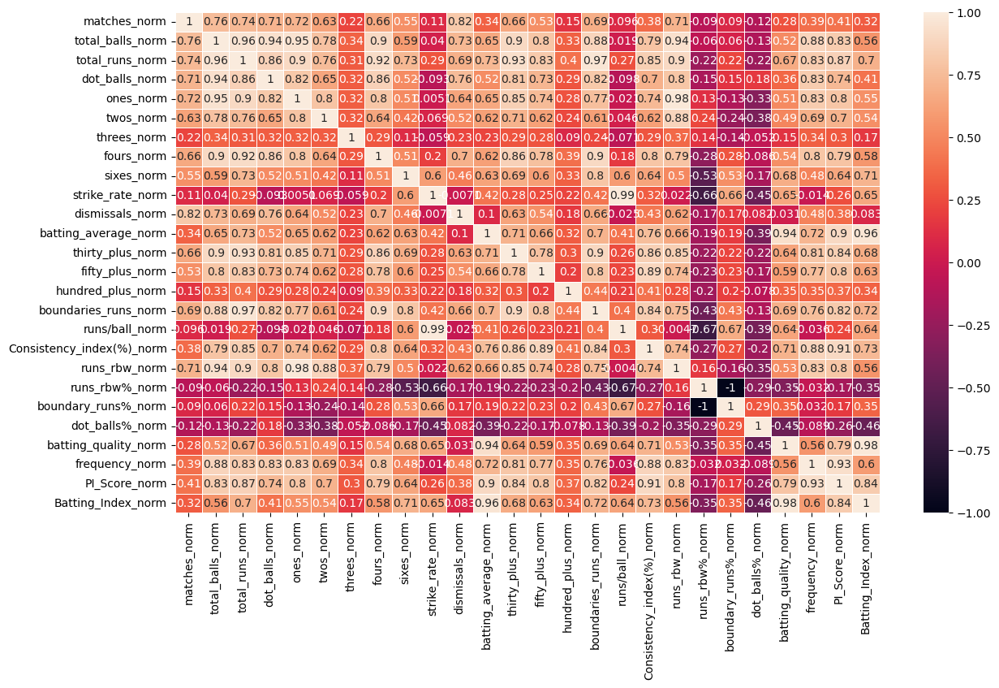

In [66]:
fig, ax = plt.subplots(figsize=(14, 8)) # Width: 12 inches, Height: 8 inches

sns.heatmap(df_norm_scaled.corr(), annot=True, linewidths=0.5, ax=ax)

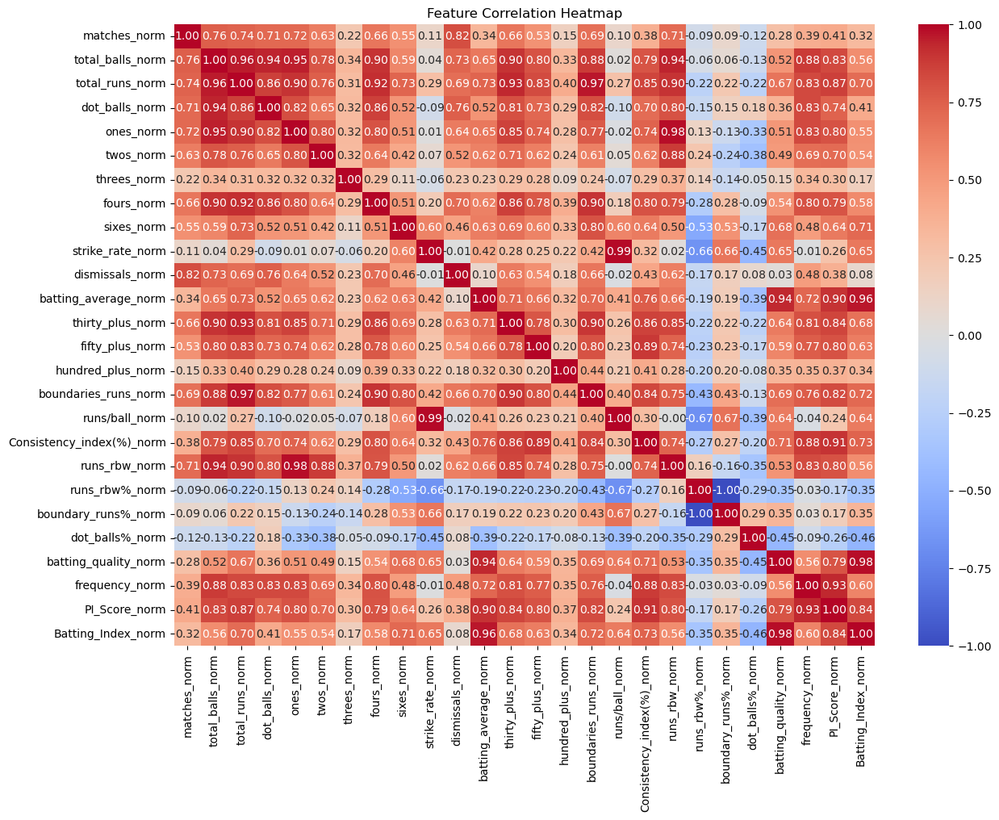

In [67]:
plt.figure(figsize=(14,10))
sns.heatmap(df_norm_scaled.corr(), cmap="coolwarm", annot=True, fmt='.2f')
plt.title('Feature Correlation Heatmap')
plt.show()

<Axes: xlabel='Consistency_index(%)', ylabel='total_runs'>

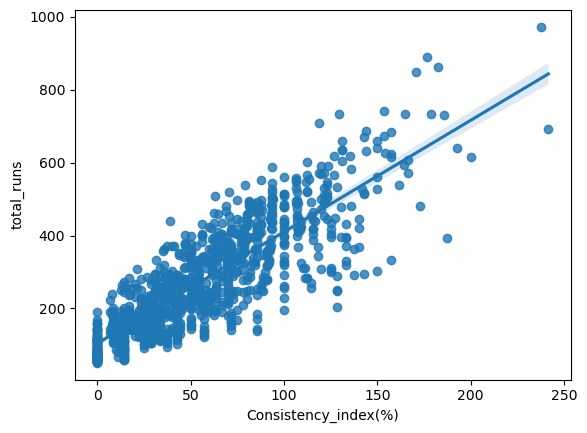

In [68]:
sns.regplot(x=df['Consistency_index(%)'], y=df['total_runs'], data=df)

In [69]:
df[["PI_Score", "Batting_Index"]].corr()

,PI_Score,Batting_Index
PI_Score,1.000000,0.795646
Batting_Index,0.795646,1.000000


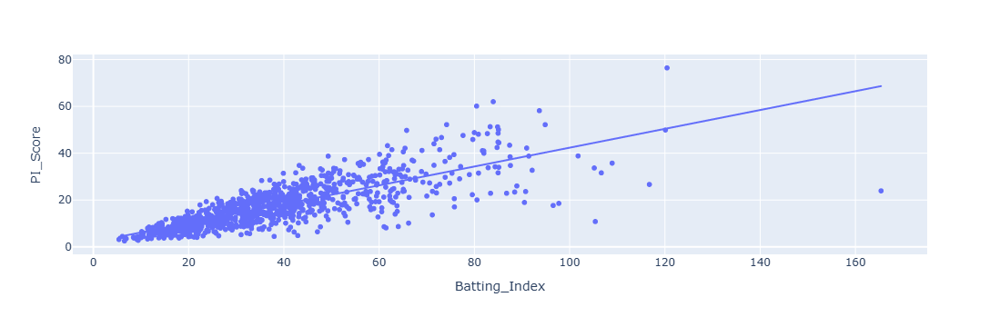

In [70]:
px.scatter(data_frame=df, x = 'Batting_Index', y = 'PI_Score', trendline='ols')

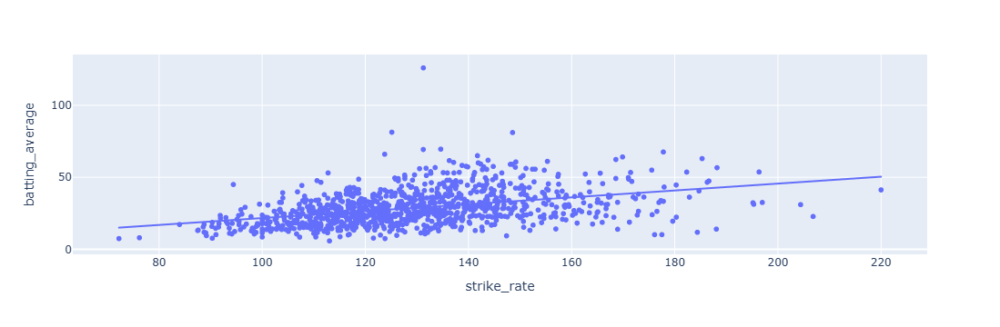

In [71]:
px.scatter(data_frame=df, x = 'strike_rate', y = 'batting_average', trendline='ols')

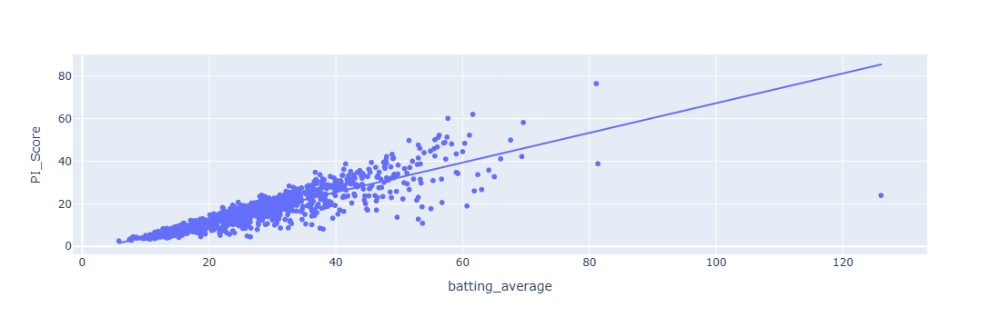

In [72]:
px.scatter(data_frame=df, x = 'batting_average', y = 'PI_Score', trendline='ols')

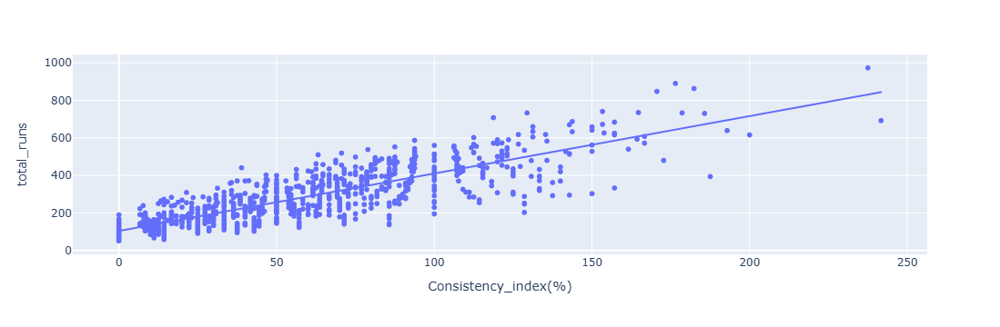

In [73]:
px.scatter(data_frame=df, x = 'Consistency_index(%)', y = 'total_runs', trendline='ols')

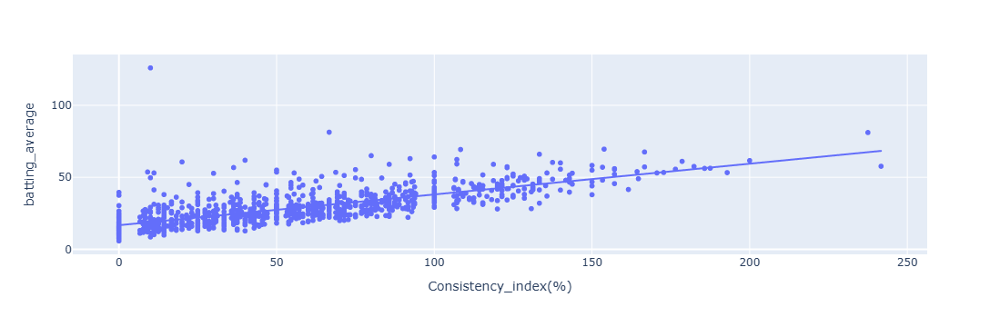

In [74]:
px.scatter(data_frame=df, x='Consistency_index(%)', y='batting_average', trendline='ols')

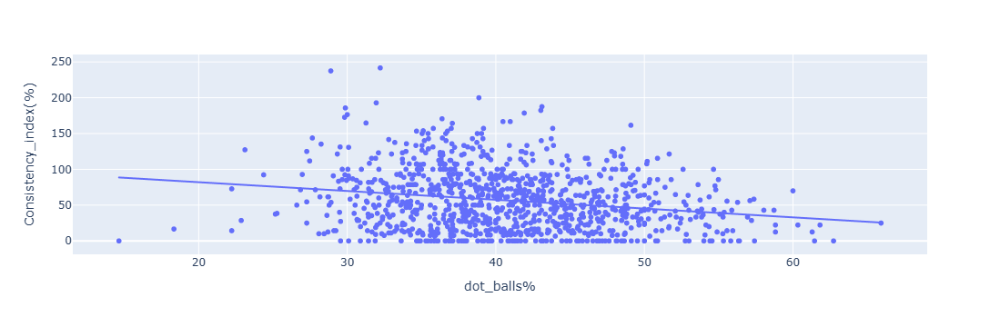

In [75]:
px.scatter(data_frame=df, x='dot_balls%', y='Consistency_index(%)', trendline='ols')

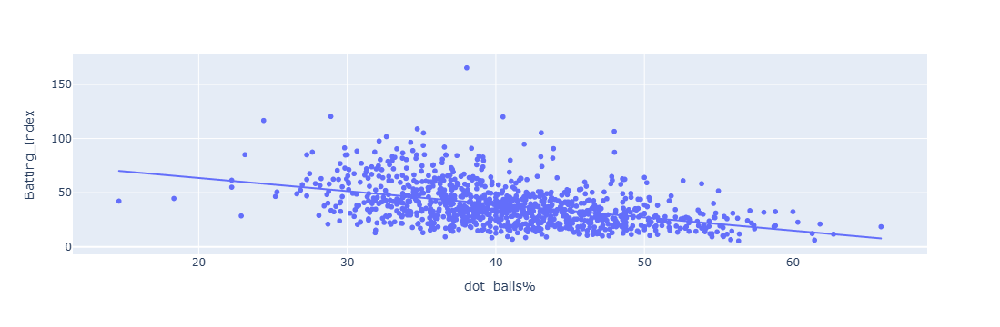

In [76]:
px.scatter(data_frame=df, x='dot_balls%', y='Batting_Index', trendline='ols')

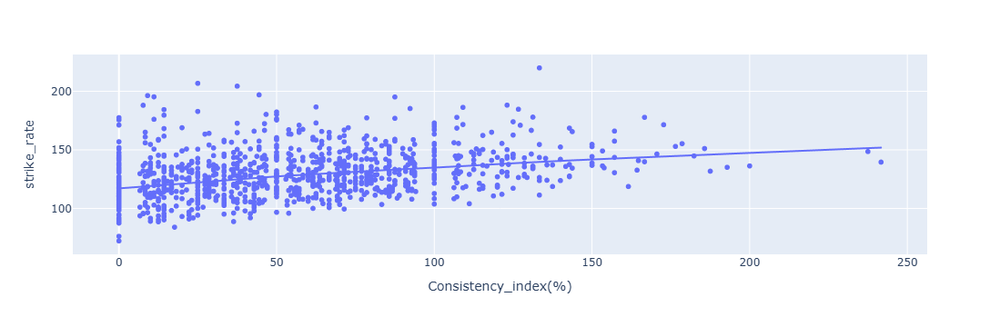

In [77]:
px.scatter(data_frame=df, x='Consistency_index(%)', y='strike_rate', trendline='lowess')

In [78]:
final_df.query('batter == "V Kohli"').head()

,batter,season,matches_norm,total_balls_norm,total_runs_norm,dot_balls_norm,ones_norm,twos_norm,threes_norm,fours_norm,sixes_norm,strike_rate_norm,dismissals_norm,batting_average_norm,thirty_plus_norm,fifty_plus_norm,hundred_plus_norm,boundaries_runs_norm,runs/ball_norm,Consistency_index(%)_norm,runs_rbw_norm,runs_rbw%_norm,boundary_runs%_norm,dot_balls%_norm,batting_quality_norm,frequency_norm,PI_Score_norm,Batting_Index_norm
52,V Kohli,2008,0.416667,0.207921,0.123644,0.315353,0.183099,-1.212995,-0.844587,0.195402,-1.041762,0.175870,0.578947,-1.521614,0.153846,-1.180999,-0.292719,0.132653,0.195122,0.068978,0.145729,0.488910,0.511090,0.732943,0.095455,0.242637,-1.148173,-1.703315
107,V Kohli,2009,0.500000,0.310231,0.211497,0.381743,0.271127,0.137468,-0.844587,0.241379,-0.243376,0.251117,0.526316,-0.460431,0.153846,-0.135704,-0.292719,0.200680,0.237805,0.127322,0.248744,0.533892,0.466108,0.587135,0.177273,0.348387,-0.313871,-0.719460
160,V Kohli,2010,0.500000,0.297030,0.277657,0.228216,0.338028,0.269576,-0.844587,0.287356,0.363081,0.473068,0.631579,-0.327238,0.384615,-0.135704,-0.292719,0.268707,0.439024,0.222825,0.301508,0.502094,0.497906,0.278363,0.245455,0.330996,-0.058044,-0.075677
220,V Kohli,2011,0.750000,0.706271,0.548807,0.775934,0.602113,1.713210,0.870500,0.620690,0.830965,0.308161,0.631579,1.209046,0.692308,1.439149,-0.292719,0.506803,0.292683,0.439649,0.577889,0.511401,0.488599,0.534503,0.350000,0.680505,1.525831,0.818768
289,V Kohli,2012,0.666667,0.485149,0.339479,0.539419,0.457746,0.514690,0.870500,0.367816,0.080032,0.250981,0.578947,0.304824,0.384615,0.575104,-0.292719,0.295918,0.237805,0.248272,0.404523,0.573135,0.426865,0.530604,0.240909,0.483590,0.491743,-0.102444


In [79]:
df['total_balls'].max(), df['total_balls'].min()

(637, 31)

In [80]:
season_choice = 2023
train = final_df[final_df['season'] < season_choice]
test = final_df[final_df['season'] == season_choice]

In [81]:
final_df.columns

Index(['batter', 'season', 'matches_norm', 'total_balls_norm',
       'total_runs_norm', 'dot_balls_norm', 'ones_norm', 'twos_norm',
       'threes_norm', 'fours_norm', 'sixes_norm', 'strike_rate_norm',
       'dismissals_norm', 'batting_average_norm', 'thirty_plus_norm',
       'fifty_plus_norm', 'hundred_plus_norm', 'boundaries_runs_norm',
       'runs/ball_norm', 'Consistency_index(%)_norm', 'runs_rbw_norm',
       'runs_rbw%_norm', 'boundary_runs%_norm', 'dot_balls%_norm',
       'batting_quality_norm', 'frequency_norm', 'PI_Score_norm',
       'Batting_Index_norm'],
      dtype='object')

In [82]:
features = ['matches_norm', 'total_balls_norm', 'total_runs_norm',
            'fours_norm', 'sixes_norm', 'thirty_plus_norm', 'fifty_plus_norm', 
            'hundred_plus_norm','runs/ball_norm', 'runs_rbw%_norm', 'boundary_runs%_norm', 'dot_balls%_norm']
targets = ['Consistency_index(%)_norm', 'PI_Score_norm', 'Batting_Index_norm']

In [83]:
X_train, y_train = train[features], train[targets]
X_test, y_test = test[features], test[targets]

In [84]:
from sklearn.linear_model import LinearRegression, RidgeCV, MultiTaskLassoCV, MultiTaskElasticNetCV
model1 = LinearRegression()
model2 = RidgeCV(alphas=[0.0001, 0.001, 0.01, 0.1, 1, 10])
model3 = MultiTaskLassoCV(alphas=[0.001, 0.01, 0.1, 1, 10, 100])
model4 = MultiTaskElasticNetCV(alphas=[0.001, 0.01, 0.1, 1, 10, 100])
models = {
    'Linear Regression': model1,
    'Ridge' : model2,
    'Lasso' : model3,
    'ElasticNet' : model4
}
metrics = []
y_pred_dict = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    metrics.append({
        'Model': name,
        'R2' : r2_score(y_pred, y_test),
        'MAE': mean_absolute_error(y_pred, y_test),
        'MSE': np.sqrt(mean_squared_error(y_pred, y_test, squared=True)),
        'RMSE': root_mean_squared_error(y_pred, y_test)
    })
    y_pred_dict[name] = pd.DataFrame(y_pred, columns=[f'{name}_pred_{col}' for col in y_test.columns])
    
metrics_df = pd.DataFrame(metrics)
y_pred_all = pd.concat(y_pred_dict.values(), axis=1)

C:\Users\aksha\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\aksha\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\aksha\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

C:\Users\aksha\anaconda3\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [85]:
metrics_df

,Model,R2,MAE,MSE,RMSE
0,Linear Regression,0.902358,0.192854,0.290631,0.247399
1,Ridge,0.902082,0.193331,0.291493,0.248104
2,Lasso,0.896916,0.197903,0.298184,0.253679
3,ElasticNet,0.893600,0.203730,0.306570,0.260480


In [86]:
y_pred_all.head()

,Linear Regression_pred_Consistency_index(%)_norm,Linear Regression_pred_PI_Score_norm,Linear Regression_pred_Batting_Index_norm,Ridge_pred_Consistency_index(%)_norm,Ridge_pred_PI_Score_norm,Ridge_pred_Batting_Index_norm,Lasso_pred_Consistency_index(%)_norm,Lasso_pred_PI_Score_norm,Lasso_pred_Batting_Index_norm,ElasticNet_pred_Consistency_index(%)_norm,ElasticNet_pred_PI_Score_norm,ElasticNet_pred_Batting_Index_norm
0,0.319083,0.640750,1.552284,0.319124,0.641165,1.552260,0.325228,0.633974,1.531961,0.323004,0.634360,1.525916
1,-0.030704,-1.030622,-0.400080,-0.030531,-1.032010,-0.400096,-0.009388,-1.022839,-0.380430,-0.016765,-1.055655,-0.391914
2,0.637340,2.697154,1.885504,0.637266,2.699374,1.886930,0.631686,2.651247,1.849937,0.633064,2.681223,1.876313
3,0.002923,-1.166574,-0.677470,0.002987,-1.166259,-0.677611,0.016557,-1.137476,-0.668196,0.011016,-1.175763,-0.692766
4,-0.003572,-1.438061,0.217900,-0.003460,-1.452118,0.207017,-0.000042,-1.530643,0.107872,-0.003475,-1.582975,-0.006801


In [87]:
model1 = LinearRegression()
model1.fit(X_train, y_train)
y_pred1 = model1.predict(X_test)
y_pred1

array([[ 3.19083180e-01,  6.40749716e-01,  1.55228447e+00],
       [-3.07044079e-02, -1.03062238e+00, -4.00080226e-01],
       [ 6.37339648e-01,  2.69715445e+00,  1.88550368e+00],
       [ 2.92264481e-03, -1.16657437e+00, -6.77469506e-01],
       [-3.57239895e-03, -1.43806150e+00,  2.17900053e-01],
       [-2.27337747e-02, -7.52625024e-01, -3.04164302e-02],
       [ 5.51656108e-01,  1.82880946e+00,  1.63567239e+00],
       [ 3.54336637e-01,  5.57578166e-01,  1.16271022e+00],
       [ 1.67539887e-01, -1.63258400e-01,  6.72693769e-02],
       [ 1.54802536e-01, -9.79687594e-01, -1.34407981e+00],
       [ 5.32532115e-01,  1.71660170e+00,  8.77287319e-01],
       [ 1.92991392e-01, -4.52755137e-01, -7.77615403e-01],
       [ 1.57111941e-01, -7.70427841e-01, -6.25220754e-01],
       [ 2.74593149e-01,  1.04495143e-01,  7.29251394e-01],
       [ 1.67312915e-01, -1.13381106e+00, -1.11919644e+00],
       [ 2.71529372e-01,  1.15817780e-02,  2.94858316e-01],
       [ 4.68187505e-01,  1.54992380e+00

In [88]:
y_pred1_df = pd.DataFrame(y_pred1, columns=['Consistency_index(%)_pred','PI_Score_pred', 'Batting_Index_pred'])

In [89]:
y_test.head()

,Consistency_index(%)_norm,PI_Score_norm,Batting_Index_norm
885,0.300948,0.520748,1.011640
886,0.000000,-1.245607,-0.941499
887,0.634460,1.953986,1.386029
888,0.000000,-1.302756,-0.765252
889,0.034468,-1.758501,0.459587


In [90]:
y_pred1_df.head()

,Consistency_index(%)_pred,PI_Score_pred,Batting_Index_pred
0,0.319083,0.640750,1.552284
1,-0.030704,-1.030622,-0.400080
2,0.637340,2.697154,1.885504
3,0.002923,-1.166574,-0.677470
4,-0.003572,-1.438061,0.217900


<Axes: xlabel='PI_Score_pred', ylabel='PI_Score_norm'>

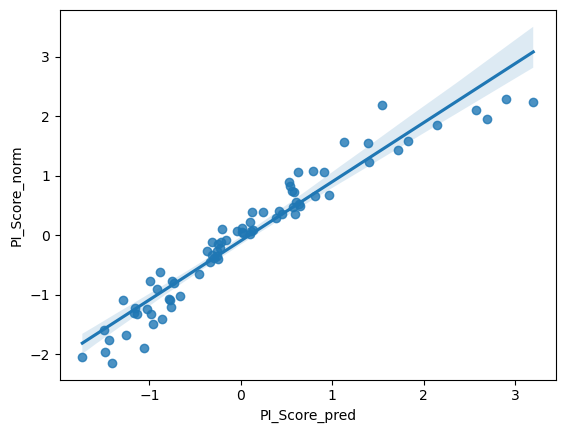

In [91]:
sns.regplot(x=y_pred1_df['PI_Score_pred'], y=y_test['PI_Score_norm'])

<Axes: xlabel='Batting_Index_pred', ylabel='Batting_Index_norm'>

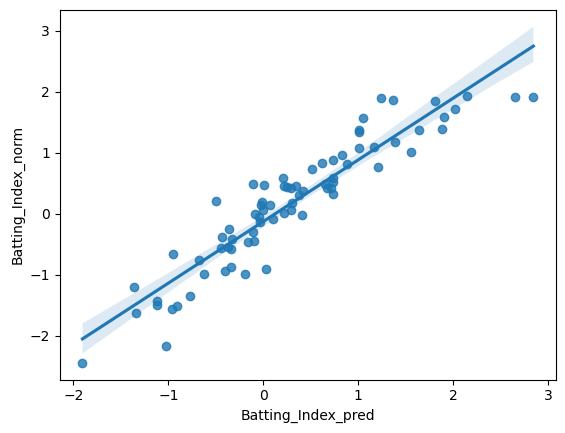

In [92]:
sns.regplot(x=y_pred1_df['Batting_Index_pred'], y=y_test['Batting_Index_norm'])

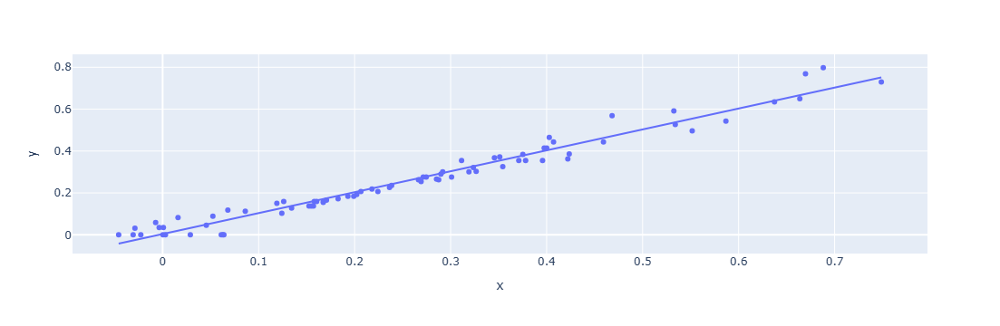

In [93]:
px.scatter(x = y_pred1_df['Consistency_index(%)_pred'], y=y_test['Consistency_index(%)_norm'], trendline='ols')

In [94]:
model2 = Ridge(alpha=1.0)
model2.fit(X_train, y_train)
y_pred2 = model2.predict(X_test)

In [95]:
df_y_pred2 = pd.DataFrame(y_pred2, columns=['Consistency_index(%)_pred','PI_Score_pred', 'Batting_Index_pred'])

<Axes: xlabel='PI_Score_pred', ylabel='PI_Score_norm'>

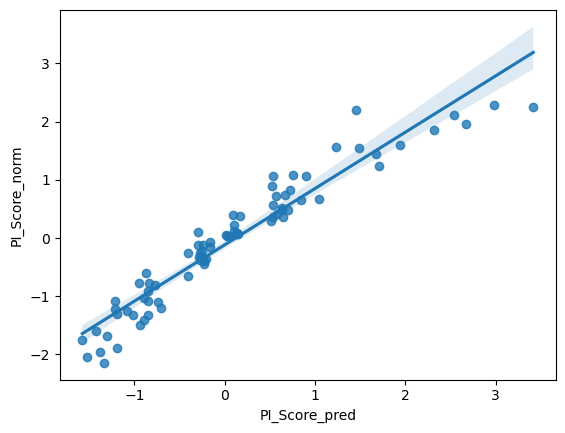

In [96]:
sns.regplot(x=df_y_pred2['PI_Score_pred'], y=y_test['PI_Score_norm'])

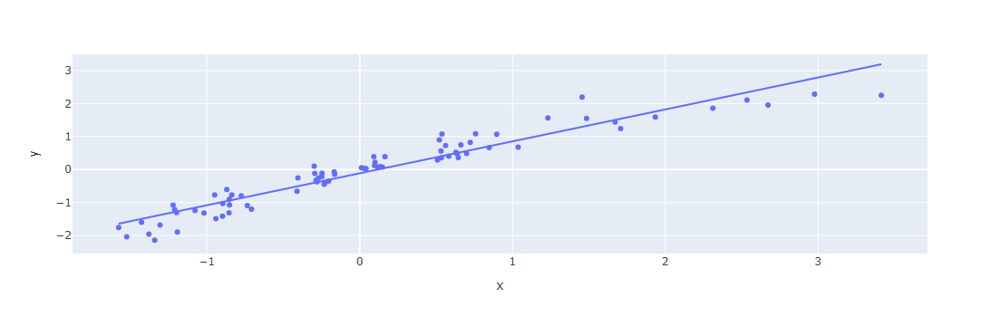

In [97]:
px.scatter(x=df_y_pred2['PI_Score_pred'], y=y_test['PI_Score_norm'], trendline='ols')

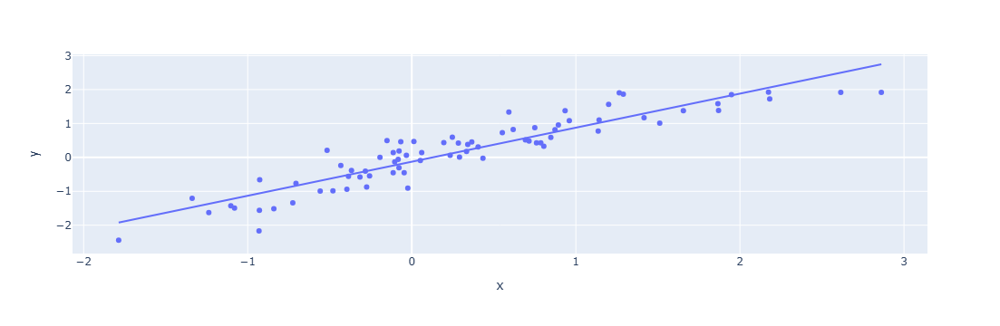

In [98]:
px.scatter(x=df_y_pred2['Batting_Index_pred'], y=y_test['Batting_Index_norm'], trendline='ols')

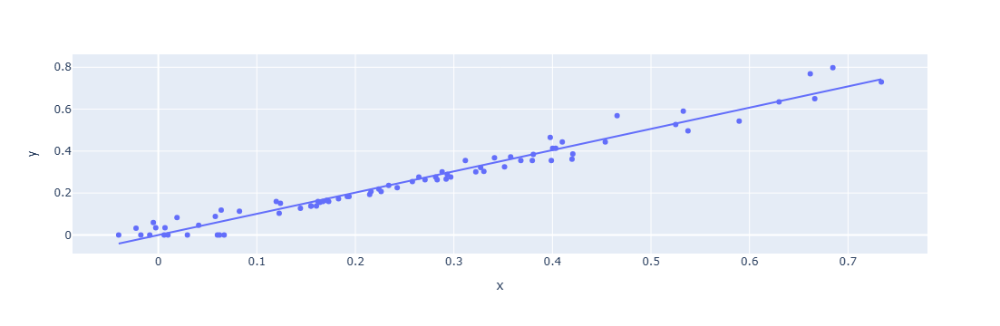

In [99]:
px.scatter(x=df_y_pred2['Consistency_index(%)_pred'], y=y_test['Consistency_index(%)_norm'], trendline='ols')

In [100]:
model3 = Lasso(alpha=0.01)
model3.fit(X_train, y_train)
y_pred3 = model3.predict(X_test)
df_y_pred3 = pd.DataFrame(y_pred3, columns=['Consistency_index(%)_pred', 'PI_Score_pred', 'Batting_Index_pred'])

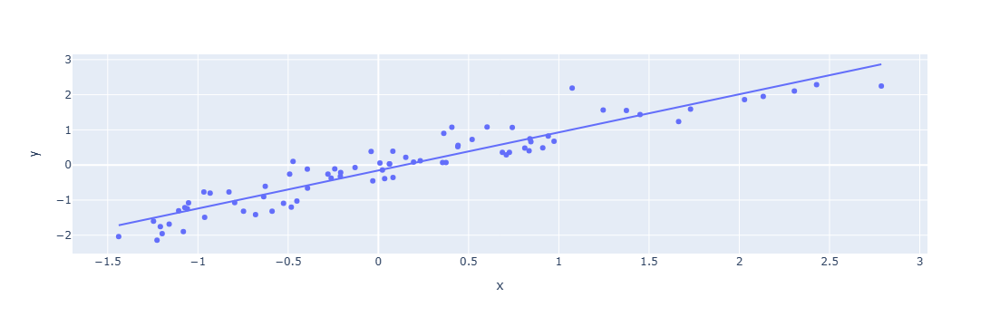

In [101]:
px.scatter(x=df_y_pred3['PI_Score_pred'], y=y_test['PI_Score_norm'], trendline='ols')

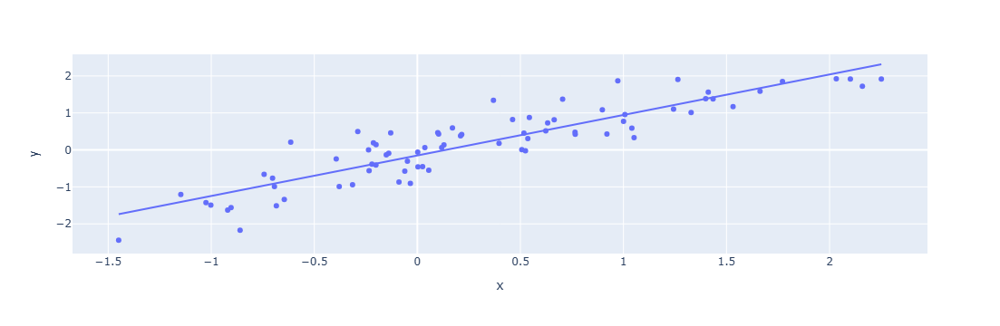

In [102]:
px.scatter(x=df_y_pred3['Batting_Index_pred'], y=y_test['Batting_Index_norm'], trendline='ols')

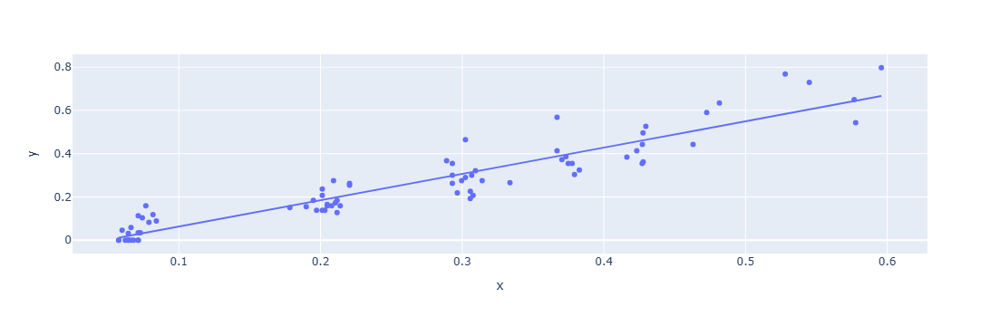

In [103]:
px.scatter(x=df_y_pred3['Consistency_index(%)_pred'], y=y_test['Consistency_index(%)_norm'], trendline='ols')

In [104]:
model4 = ElasticNet(alpha=0.01, l1_ratio=0.5)

In [105]:
model4.fit(X_train, y_train)
y_pred4 = model4.predict(X_test)
df_pred4 = pd.DataFrame(y_pred4, columns=['Consistency_index(%)_pred','PI_Score_pred', 'Batting_Index_pred'])

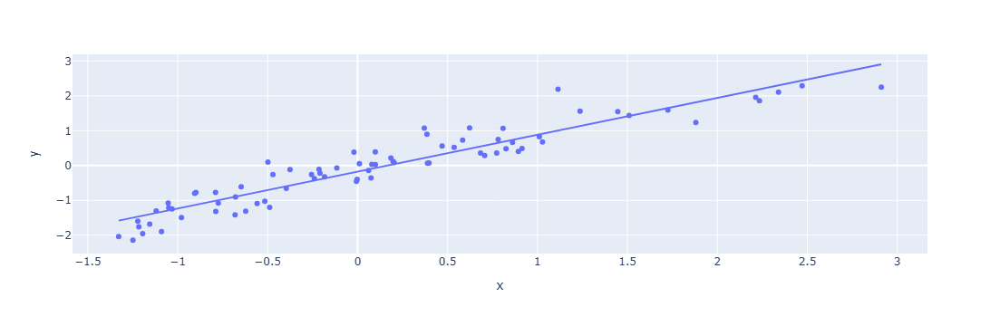

In [106]:
px.scatter(x=df_pred4['PI_Score_pred'], y=y_test['PI_Score_norm'], trendline='ols')

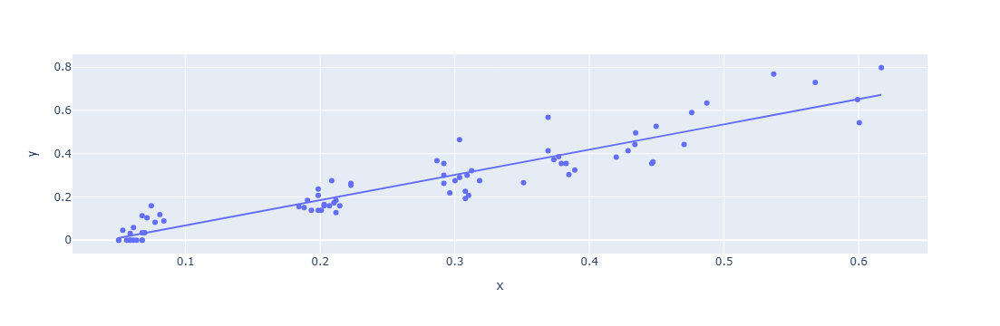

In [107]:
px.scatter(x=df_pred4['Consistency_index(%)_pred'], y=y_test['Consistency_index(%)_norm'], trendline='ols')

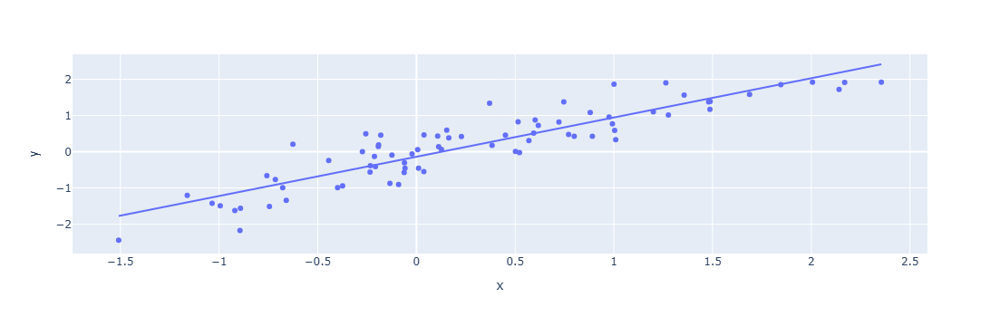

In [108]:
px.scatter(x=df_pred4['Batting_Index_pred'], y=y_test['Batting_Index_norm'], trendline='ols')

In [109]:
model5 = RandomForestRegressor(random_state=42, n_estimators=100)
model5.fit(X_train, y_train)
y_pred5 = model5.predict(X_test)
df_pred5 = pd.DataFrame(y_pred5, columns=['Consistency_index(%)_pred', 'PI_Score_pred', 'Batting_Index_pred'])

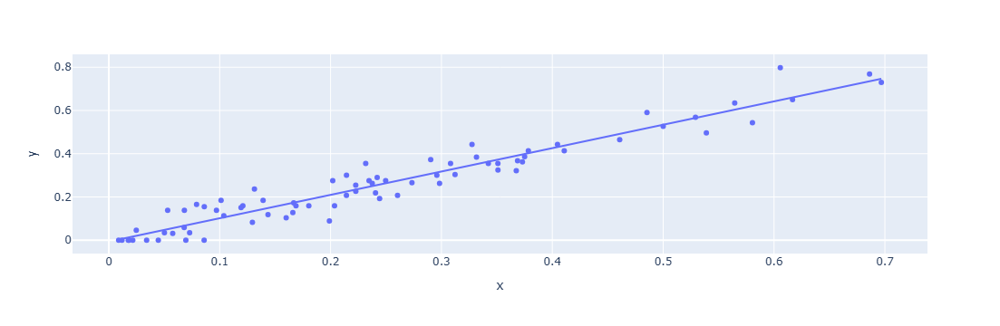

In [110]:
px.scatter(x=df_pred5['Consistency_index(%)_pred'], y=y_test['Consistency_index(%)_norm'], trendline='ols')

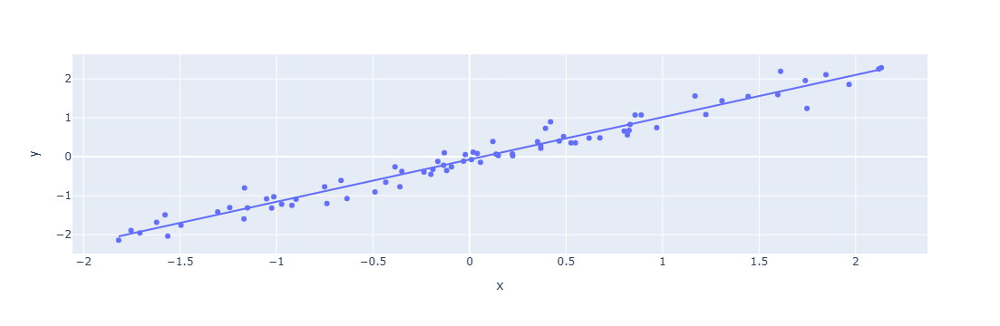

In [111]:
px.scatter(x=df_pred5['PI_Score_pred'], y=y_test['PI_Score_norm'], trendline='ols')

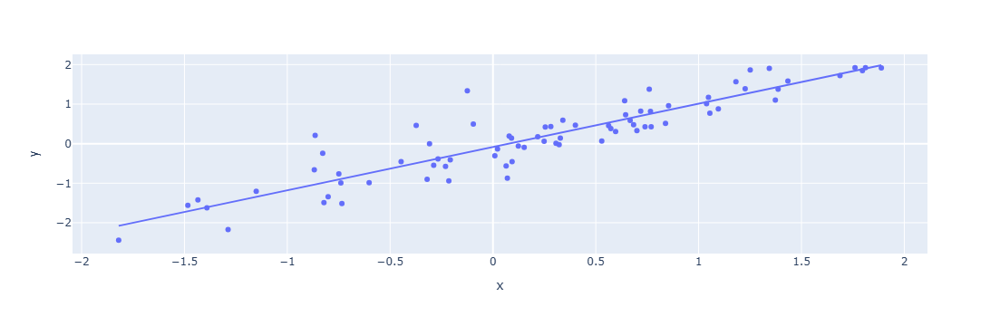

In [112]:
px.scatter(x=df_pred5['Batting_Index_pred'], y=y_test['Batting_Index_norm'], trendline='ols')